# 準備

In [ ]:
!pip install japanize-matplotlib

# imports
import pickle
import numpy as np
import pandas as pd
import japanize_matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
import matplotlib.animation as animation
import cv2

In [ ]:
BASE_DIR = ''

# データの読み込み
with open(f'{BASE_DIR}/results/pred.pickle', 'rb') as f:
  data = pickle.load(f)
with open(f'{BASE_DIR}/results/pred_no_transform.pickle', 'rb') as f:
  data2 = pickle.load(f)

In [ ]:
# 自作関数
def psnr(pred, true) -> float:
  x_max = max(pred.max(),true.max())
  x_min = min(pred.min(),true.min())
  return -10 * np.log10(mse((pred-x_min)/(x_max-x_min), (true-x_min)/(x_max-x_min)))


def rmse(pred, true) -> float:
  return np.sqrt(((pred - true)**2).mean())


def mse(pred, true) -> float:
  return ((pred - true)**2).mean()


def me(pred, true) -> float:
  return (pred - true).mean()

def uv2w(u, v):
  return np.sqrt(u**2 + v**2)

# metrics

__評価指標__  
【凡例】P：降水量、T：気温、R：湿数、U：東西風、V：南北風、W：風速  
【注】東風西風などはバグを含む可能性あり(min,maxで抽出しているため)
1. 降水量全体のPSNR　　　　　　　　　　　 ：PSNR_P
1. 気温全体のPSNR　　　　　　　　　　　　 ：PSNR_T
1. 湿数全体のPSNR　　　　　　　　　　　　 ：PSNR_R
1. 東西風全体のPSNR　　　　　　　　　　　 ：PSNR_U
1. 南北風全体のPSNR　　　　　　　　　　　 ：PSNR_V
1. 風速全体のPSNR　　　　　　　　　　　　 ：PSNR_W
1. 時系列方向積算降水量のRMSE　　　　　　 ：RMSE_CPT
1. 領域積算降水量のRMSE　　　　　　　　　 ：RMSE_CPR
1. 時系列方向最大降水量のRMSE　　　　　　 ：RMSE_XPT
1. 領域最大降水量のRMSE　　　　　　　　　 ：RMSE_XPR
1. 時系列方向99.9%タイル値のRMSE　　　 　 ：RMSE_999
1. 時系列方向10mm/h以上の発生確率のRMSE ：RMSE_10
1. 時系列方向4mm/h以上の発生確率のRMSE　：RMSE_4
1. 時系列方向0.1mm/h以上の発生確率のRMSE ：RMSE_0.1
1. 全平均気温のRMSE　　　　　　　　　　　 ：RMSE_AT
1. 全平均湿数のRMSE　　　　　　　　　　　 ：RMSE_AR
1. 全平均東西風のRMSE　　　　　　　　　　 ：RMSE_AU
1. 時系列方向最大西風のRMSE　　　　　　　 ：RMSE_XUT+
1. 時系列方向最大東風のRMSE　　　　　　　 ：RMSE_XUT-
1. 領域最大西風のRMSE　　　　　　　　　　 ：RMSE_XUR+
1. 領域最大東風のRMSE　　　　　　　　　　 ：RMSE_XUR-
1. 全平均南北風のRMSE　　　　　　　　　　 ：RMSE_AV
1. 時系列方向最大南風のRMSE　　　　　　　 ：RMSE_XVT+
1. 時系列方向最大北風のRMSE　　　　　　　 ：RMSE_XVT-
1. 領域最大南風のRMSE　　　　　　　　　　 ：RMSE_XVR+
1. 領域最大北風のRMSE　　　　　　　　　　 ：RMSE_XVR-
1. 全平均風速のRMSE　　　　　　　　　　　 ：RMSE_AW
1. 時系列方向最大風速のRMSE　　　　　　　 ：RMSE_XWT
1. 領域最大風速のRMSE　　　　　　　　　　 ：RMSE_XWR
1. 降水量全体の相関係数　　　　　　　　　　：CORR_P
1. 気温全体の相関係数　　　　　　　　　　　：CORR_T
1. 湿数全体の相関係数　　　　　　　　　　　：CORR_R
1. 東西風全体の相関係数　　　　　　　　　　：CORR_U
1. 南北風全体の相関係数　　　　　　　　　　：CORR_V
1. 風速全体の相関係数　　　　　　　　　　　：CORR_W

In [ ]:
import pandas as pd
df = pd.DataFrame(np.zeros((35, 5)), columns=['Input', 'MLP', 'CNN1', 'CNN2', 'CNN3'])
df.index = ['PSNR_P', 'RMSE_CPT', 'RMSE_CPR', 'RMSE_XPT', 'RMSE_XPR', 'RMSE_999', 'RMSE_10', 'RMSE_4', 'RMSE_0.1', 'CORR_P', #9
            'PSNR_T', 'RMSE_AT', 'CORR_T', #12
            'PSNR_R', 'RMSE_AR', 'CORR_R', #15
            'PSNR_U', 'RMSE_AU', 'RMSE_XUT+', 'RMSE_XUT-', 'RMSE_XUR+', 'RMSE_XUR-', 'CORR_U', #22
            'PSNR_V', 'RMSE_AV', 'RMSE_XVT+', 'RMSE_XVT-', 'RMSE_XVR+', 'RMSE_XVR-', 'CORR_V', #29
            'PSNR_W', 'RMSE_AW', 'RMSE_XWT', 'RMSE_XWR', 'CORR_W']#34

In [ ]:
df2 = pd.DataFrame(np.zeros((23, 5)), columns=['Input', 'MLP', 'CNN1', 'CNN2', 'CNN3'])
df2.index = ['ME_CPT', 'ME_CPR', 'ME_XPT', 'ME_XPR', 'ME_999', 'ME_10', 'ME_4', 'ME_0.1', #7
             'ME_AT', #8
             'ME_AR', #9
             'ME_AU', 'ME_XUT+', 'ME_XUT-', 'ME_XUR+', 'ME_XUR-', #14
             'ME_AV', 'ME_XVT+', 'ME_XVT-', 'ME_XVR+', 'ME_XVR-', #19
             'ME_AW', 'ME_XWT', 'ME_XWR']#22

In [ ]:
## PSNR
for j, col in enumerate(df.columns):
  for i, idx in enumerate(df.index[[0,10,13,16,23,30]]):
    df[col][idx] = psnr(data2[:,6300*(j+1)+900*i:6300*(j+1)+900*(i+1)], data2[:,900*i:900*(i+1)])

In [ ]:
## CORR
for j, col in enumerate(df.columns):
  for i, idx in enumerate(df.index[[9,12,15,22,29,34]]):
    df[col][idx] = np.corrcoef(data2[:,6300*(j+1)+900*i:6300*(j+1)+900*(i+1)].reshape(-1), data2[:,900*i:900*(i+1)].reshape(-1))[0,1]

In [ ]:
## RMSE_A○, ME_A○
for j, col in enumerate(df.columns):
  for i, (idx,idx2) in enumerate(zip(df.index[[11,14,17,24,31]], df2.index[[8,9,10,15,20]])):
    df[col][idx] = rmse(data2[:,6300*(j+1)+900*(i+1):6300*(j+1)+900*(i+2)], data2[:,900*(i+1):900*(i+2)])
    df2[col][idx2] = me(data2[:,6300*(j+1)+900*(i+1):6300*(j+1)+900*(i+2)], data2[:,900*(i+1):900*(i+2)])

In [ ]:
## RMSE_X○T, ME_X○T
for j, col in enumerate(df.columns):
  for i, (idx,idx2) in enumerate(zip(df.index[[18,25,32]], df2.index[[11,16,21]])):
    df[col][idx] = rmse(data2[:,6300*(j+1)+900*(i+1):6300*(j+1)+900*(i+2)].max(axis=0), data2[:,900*(i+1):900*(i+2)].max(axis=0))
    df2[col][idx2] = me(data2[:,6300*(j+1)+900*(i+1):6300*(j+1)+900*(i+2)].max(axis=0), data2[:,900*(i+1):900*(i+2)].max(axis=0))
  df[col]['RMSE_XPT'] = rmse(data2[:,6300*(j+1):6300*(j+1)+900].max(axis=0), data2[:,:900].max(axis=0))
  df2[col]['ME_XPT'] = me(data2[:,6300*(j+1):6300*(j+1)+900].max(axis=0), data2[:,:900].max(axis=0))

In [ ]:
## RMSE_X○R, ME_X○R
for j, col in enumerate(df.columns):
  for i, (idx,idx2) in enumerate(zip(df.index[[20,27,33]], df2.index[[13,18,22]])):
    df[col][idx] = rmse(data2[:,6300*(j+1)+900*(i+1):6300*(j+1)+900*(i+2)].max(axis=1), data2[:,900*(i+1):900*(i+2)].max(axis=1))
    df2[col][idx2] = me(data2[:,6300*(j+1)+900*(i+1):6300*(j+1)+900*(i+2)].max(axis=1), data2[:,900*(i+1):900*(i+2)].max(axis=1))
  df[col]['RMSE_XPR'] = rmse(data2[:,6300*(j+1):6300*(j+1)+900].max(axis=1), data2[:,:900].max(axis=1))
  df2[col]['ME_XPR'] = me(data2[:,6300*(j+1):6300*(j+1)+900].max(axis=1), data2[:,:900].max(axis=1))

In [ ]:
## RMSE_X○T-, ME_X○T-
for j, col in enumerate(df.columns):
  for i, (idx,idx2) in enumerate(zip(df.index[[19,26]], df2.index[[12,17]])):
    df[col][idx] = rmse(data2[:,6300*(j+1)+900*(i+3):6300*(j+1)+900*(i+4)].min(axis=0), data2[:,900*(i+3):900*(i+4)].min(axis=0))
    df2[col][idx2] = me(data2[:,6300*(j+1)+900*(i+3):6300*(j+1)+900*(i+4)].min(axis=0), data2[:,900*(i+3):900*(i+4)].min(axis=0))

In [ ]:
## RMSE_X○R-, ME_X○R-
for j, col in enumerate(df.columns):
  for i, (idx,idx2) in enumerate(zip(df.index[[21,28]], df2.index[[14,19]])):
    df[col][idx] = rmse(data2[:,6300*(j+1)+900*(i+3):6300*(j+1)+900*(i+4)].min(axis=1), data2[:,900*(i+3):900*(i+4)].min(axis=1))
    df2[col][idx2] = me(data2[:,6300*(j+1)+900*(i+3):6300*(j+1)+900*(i+4)].min(axis=1), data2[:,900*(i+3):900*(i+4)].min(axis=1))

In [ ]:
## RMSE_CPT, ME_CPT
for j, col in enumerate(df.columns):
  df[col]['RMSE_CPT'] = rmse(data2[:,6300*(j+1):6300*(j+1)+900].sum(axis=0), data2[:,:900].sum(axis=0))
  df2[col]['ME_CPT'] = me(data2[:,6300*(j+1):6300*(j+1)+900].sum(axis=0), data2[:,:900].sum(axis=0))

In [ ]:
## RMSE_CPR, ME_CPR
for j, col in enumerate(df.columns):
  df[col]['RMSE_CPR'] = rmse(data2[:,6300*(j+1):6300*(j+1)+900].sum(axis=1), data2[:,:900].sum(axis=1))
  df2[col]['ME_CPR'] = me(data2[:,6300*(j+1):6300*(j+1)+900].sum(axis=1), data2[:,:900].sum(axis=1))

In [ ]:
## RMSE_999, ME_999
for j, col in enumerate(df.columns):
  df[col]['RMSE_999'] = rmse(np.percentile(data2[:,6300*(j+1):6300*(j+1)+900], q=99.9, axis=0), np.percentile(data2[:,:900], q=99.9, axis=0))
  df2[col]['ME_999'] = me(np.percentile(data2[:,6300*(j+1):6300*(j+1)+900], q=99.9, axis=0), np.percentile(data2[:,:900], q=99.9, axis=0))

In [ ]:
## RMSE_○, ME_○
for j, col in enumerate(df.columns):
  df[col]['RMSE_10'] = rmse(np.count_nonzero(data2[:,6300*(j+1):6300*(j+1)+900]>10.0, axis=0)/len(data2), np.count_nonzero(data2[:,:900]>10.0, axis=0)/len(data2))
  df[col]['RMSE_4'] = rmse(np.count_nonzero(data2[:,6300*(j+1):6300*(j+1)+900]>4.0, axis=0)/len(data2), np.count_nonzero(data2[:,:900]>4.0, axis=0)/len(data2))
  df[col]['RMSE_0.1'] = rmse(np.count_nonzero(data2[:,6300*(j+1):6300*(j+1)+900]>0.1, axis=0)/len(data2), np.count_nonzero(data2[:,:900]>0.1, axis=0)/len(data2))
  df2[col]['ME_10'] = me(np.count_nonzero(data2[:,6300*(j+1):6300*(j+1)+900]>10.0, axis=0)/len(data2), np.count_nonzero(data2[:,:900]>10.0, axis=0)/len(data2))
  df2[col]['ME_4'] = me(np.count_nonzero(data2[:,6300*(j+1):6300*(j+1)+900]>4.0, axis=0)/len(data2), np.count_nonzero(data2[:,:900]>4.0, axis=0)/len(data2))
  df2[col]['ME_0.1'] = me(np.count_nonzero(data2[:,6300*(j+1):6300*(j+1)+900]>0.1, axis=0)/len(data2), np.count_nonzero(data2[:,:900]>0.1, axis=0)/len(data2))

In [ ]:
df

,Input,MLP,CNN1,CNN2,CNN3
PSNR_P,39.026546,37.645996,39.681809,39.399471,39.708607
RMSE_CPT,1425.099121,332.104462,868.068970,962.841614,1112.586060
RMSE_CPR,873.349365,1274.537231,705.376831,724.119263,771.195496
RMSE_XPT,49.280540,69.789131,48.110886,45.494263,55.371296
RMSE_XPR,8.899266,9.896924,8.593130,8.531148,8.968022
RMSE_999,18.523600,26.501411,13.721505,12.268347,17.363039
RMSE_10,0.006348,0.007075,0.003214,0.003384,0.005399
RMSE_4,0.011122,0.019602,0.003934,0.005628,0.007187
RMSE_0.1,0.018648,0.875584,0.323177,0.175701,0.392475
CORR_P,0.555495,0.035044,0.614821,0.594635,0.604534


In [ ]:
df

,Input,MLP,CNN1,CNN2,CNN3
PSNR_P,39.026546,39.065106,39.550378,39.870441,43.284731
RMSE_CPT,1425.099121,255.539642,486.420654,475.218079,1220.734985
RMSE_CPR,873.349365,862.601868,740.984131,675.579590,709.989746
RMSE_XPT,49.280540,49.149952,45.235950,43.151833,33.734364
RMSE_XPR,8.899266,8.862064,8.687263,8.578614,8.621732
RMSE_999,18.523600,18.378004,16.320567,14.196468,12.764807
RMSE_10,0.006348,0.006316,0.005344,0.003592,0.002878
RMSE_4,0.011122,0.010490,0.005849,0.004021,0.004253
RMSE_0.1,0.018648,0.774772,0.297295,0.215305,0.437096
CORR_P,0.555495,0.555679,0.602103,0.633932,0.626040


In [ ]:
df2

,Input,MLP,CNN1,CNN2,CNN3
ME_CPT,-1332.663208,170.431503,783.797302,643.562805,-137.239532
ME_CPR,-136.917465,17.509977,80.527122,66.119446,-14.099954
ME_XPT,-42.536877,-64.664421,-41.884140,-39.822968,-50.289963
ME_XPR,-2.389545,-2.552410,-2.005333,-1.909044,-2.211569
ME_999,-17.616723,-25.739582,-13.070874,-11.279638,-16.760172
ME_10,-0.005944,-0.006677,-0.002354,-0.001263,-0.005134
ME_4,-0.010520,-0.019106,0.001870,0.002160,-0.006270
ME_0.1,0.013491,0.875105,0.318460,0.158605,0.365968
ME_AT,0.402956,0.759871,0.828481,0.364528,0.216318
ME_AR,-1.002129,0.228472,-0.033321,0.549142,0.394212


In [ ]:
df.to_csv(f'{BASE_DIR}/results/metrics_no_transform.csv')
df2.to_csv(f'{BASE_DIR}/results/me_no_transform.csv')

# graphs・images

__グラフ・画像__  
【凡例】P：降水量、T：気温、R：湿数、U：東西風、V：南北風、W：風速、D：風向
1. サンプル(P○→P○)_PW
1. サンプル(P○→P○)_TW
1. サンプル(P○→P○)_RW
1. サンプル(P○→P×)_PW
1. サンプル(P○→P×)_TW
1. サンプル(P○→P×)_RW
1. サンプル(P×→P○)_PW
1. サンプル(P×→P○)_TW
1. サンプル(P×→P○)_RW
1. サンプル(P×→P×)_PW
1. サンプル(P×→P×)_TW
1. サンプル(P×→P×)_RW
1. ヒストグラム_P
1. ヒストグラム_T
1. ヒストグラム_R
1. ヒストグラム_U
1. ヒストグラム_V
1. ヒストグラム_W
1. ヒストグラム_D
1. 領域合計降水量の時系列
1. 領域平均気温の時系列
1. 領域平均湿数の時系列
1. 領域平均風速の時系列
1. 領域最大風速の時系列
1. 気温平均日変動
1. 湿数平均日変動
1. 風速平均日変動
1. 時系列方向合計降水量
1. 時系列方向最大降水量
1. 時系列方向降水量99.9%タイル値
1. 時系列方向降水量99%タイル値
1. 時系列方向降水量90%タイル値
1. 時系列方向降水量50%タイル値
1. 時系列方向平均気温
1. 時系列方向最高気温
1. 時系列方向最低気温
1. 時系列方向平均湿数
1. 時系列方向最高湿数
1. 時系列方向最低湿数
1. 時系列方向平均東西風
1. 時系列方向平均南北風
1. 時系列方向平均風速
1. 時系列方向最大風速
1. 時系列方向降水量のRMSE
1. 時系列方向気温のRMSE
1. 時系列方向湿数のRMSE
1. 時系列方向東西風のRMSE
1. 時系列方向南北風のRMSE
1. 時系列方向風速のRMSE
1. 時系列方向降水量のME
1. 時系列方向気温のME
1. 時系列方向湿数のME
1. 時系列方向東西風のME
1. 時系列方向南北風のME
1. 時系列方向風速のME
1. 降水量0.1mm/h以上の発生確率
1. 降水量1mm/h以上の発生確率
1. 降水量4mm/h以上の発生確率
1. 降水量10mm/h以上の発生確率
1. 降水量30mm/h以上の発生確率
1. 降水量全体の散布図
1. 気温全体の散布図
1. 湿数全体の散布図
1. 風速全体の散布図

## サンプル

### ○→○

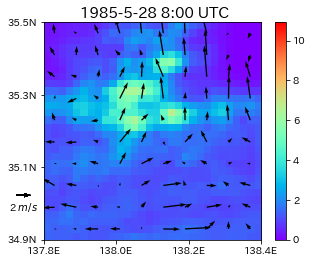

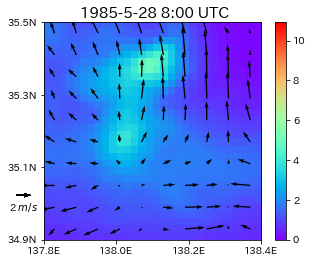

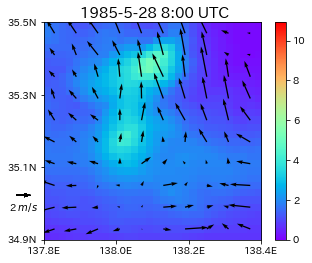

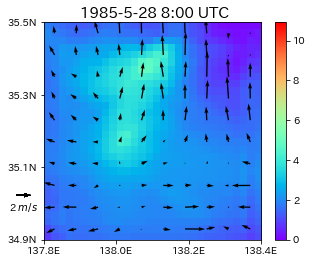

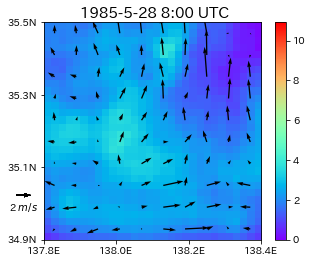

...

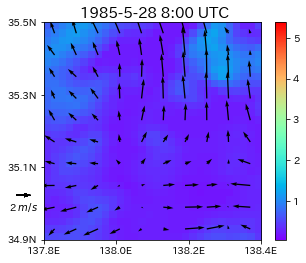

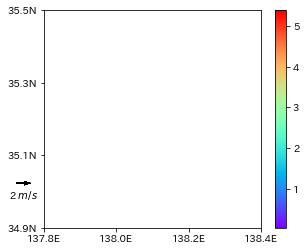

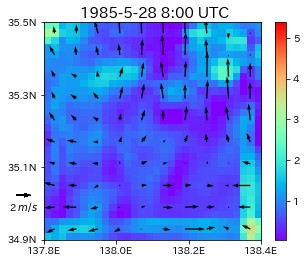

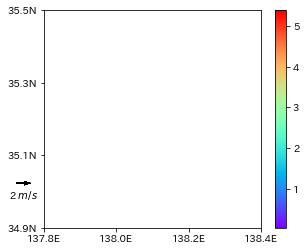

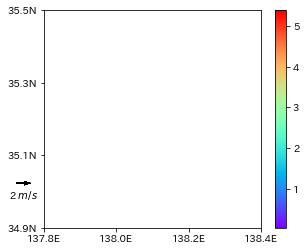

In [ ]:
# ○→○
start, end = 6454, 6466
times = [*[f'1985-5-27 {time}:00 UTC' for time in range(21,24)], *[f'1985-5-28 {time}:00 UTC' for time in range(9)]]
nets = ['true', 'input', 'MLP', 'SRCNN', 'UNet', 'SE-SRResNet']
variables = ['P', 'T', 'R']
X = [list(range(1,30,3)) for _ in range(1,30,3)]
Y = [[_]*10 for _ in range(1,30,3)]
for k,variable in enumerate(variables):
  for j,net in enumerate(nets):
    fig = plt.figure(figsize=(5,4))
    ax = fig.add_subplot(111)
    pmin, pmax, ims = data[start:end,900*k:900*(k+1)].min(), data[start:end,900*k:900*(k+1)].max(), []
    im = ax.imshow(np.zeros((30,30)), cmap='gray', animated=True, vmin=pmin, vmax=pmax)
    ims.append([im])
    for i,t in enumerate(times):
      im = ax.imshow(data[i+start,6300*j+900*k:6300*j+900*(k+1)].reshape((30,30))[::-1], cmap='rainbow', animated=True, vmin=pmin, vmax=pmax)
      im2 = ax.quiver(X, Y, data[i+start,j*6300+2700:j*6300+3600].reshape((30,30))[1::3,1::3], -data[i+start,j*6300+3600:j*6300+4500].reshape((30,30))[28::-3,1::3], animated=True, angles='xy', scale_units='xy', scale=1)
      if i==0:
        plt.quiverkey(im2, 0.085, 0.28, 2, '2 $m/s$', labelpos='S', coordinates='figure', labelsep=0.08)
        cbar = fig.colorbar(im, ax=ax)
        cbar.min, cbar.max = pmin, pmax
      ax.set_xticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_xticklabels(['137.8E','138.0E','138.2E','138.4E'])
      ax.set_yticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_yticklabels(['35.5N','35.3N','35.1N','34.9N'])
      im3 = ax.text(4.5, -1.1, t, animated=True, fontsize=15)
      ims.append([im,im2,im3])
    ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000)
    ani.save(f'{BASE_DIR}/images/sample{variable}_{net}_rainbow_85-5-27-21_85-5-28-8.gif', writer='pillow')

### ○→×

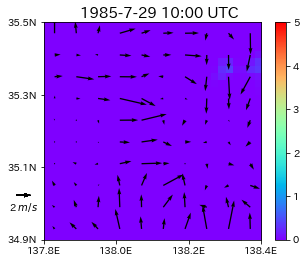

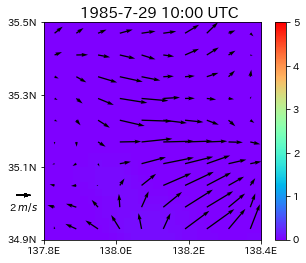

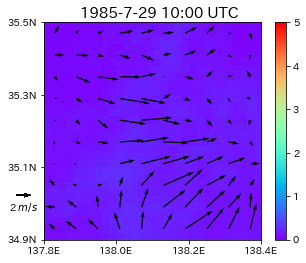

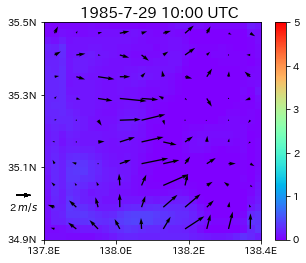

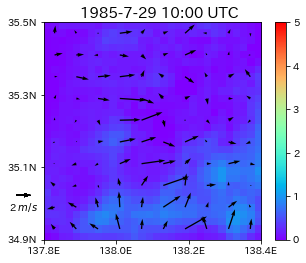

...

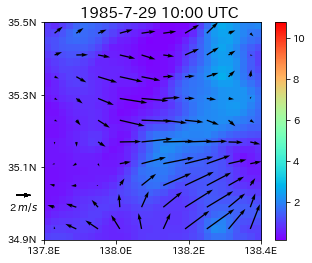

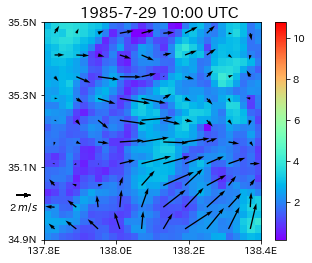

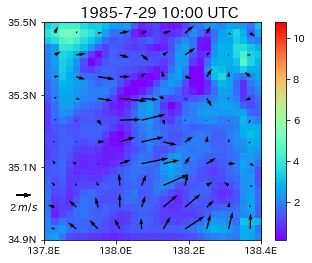

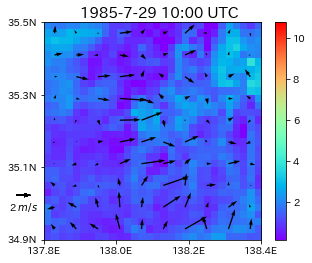

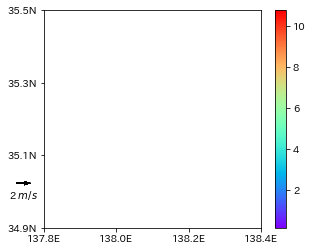

In [ ]:
# ○→×
start, end = 7945, 7955
times = [f'1985-7-29 {time}:00 UTC' for time in range(11)]
nets = ['true', 'input', 'MLP', 'SRCNN', 'UNet', 'SE-SRResNet']
variables = ['P', 'T', 'R']
X = [list(range(1,30,3)) for _ in range(1,30,3)]
Y = [[_]*10 for _ in range(1,30,3)]
for k,variable in enumerate(variables):
  for j,net in enumerate(nets):
    fig = plt.figure(figsize=(5,4))
    ax = fig.add_subplot(111)
    if k==0:
      pmin, pmax, ims = 0, 5, []
    else:
      pmin, pmax, ims = data[start:end,900*k:900*(k+1)].min(), data[start:end,900*k:900*(k+1)].max(), []
    im = ax.imshow(np.zeros((30,30)), cmap='gray', animated=True, vmin=pmin, vmax=pmax)
    ims.append([im])
    for i,t in enumerate(times):
      im = ax.imshow(data[i+start,6300*j+900*k:6300*j+900*(k+1)].reshape((30,30))[::-1], cmap='rainbow', animated=True, vmin=pmin, vmax=pmax)
      im2 = ax.quiver(X, Y, data[i+start,j*6300+2700:j*6300+3600].reshape((30,30))[1::3,1::3], -data[i+start,j*6300+3600:j*6300+4500].reshape((30,30))[28::-3,1::3], animated=True, angles='xy', scale_units='xy', scale=1)
      if i==0:
        plt.quiverkey(im2, 0.085, 0.28, 2, '2 $m/s$', labelpos='S', coordinates='figure', labelsep=0.08)
        cbar = fig.colorbar(im, ax=ax)
        cbar.min, cbar.max = pmin, pmax
      ax.set_xticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_xticklabels(['137.8E','138.0E','138.2E','138.4E'])
      ax.set_yticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_yticklabels(['35.5N','35.3N','35.1N','34.9N'])
      im3 = ax.text(4.5, -1.1, t, animated=True, fontsize=15)
      ims.append([im,im2,im3])
    ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000)
    ani.save(f'{BASE_DIR}/images/sample{variable}_{net}_rainbow_85-7-29-0_85-7-29-9.gif', writer='pillow')

### ×→○

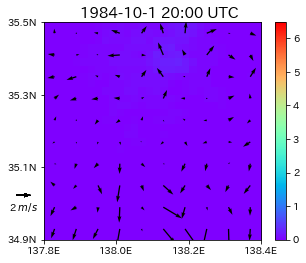

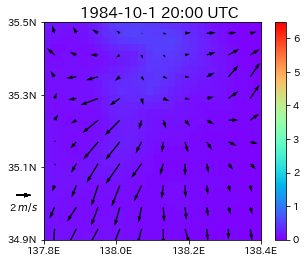

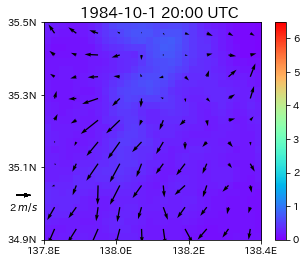

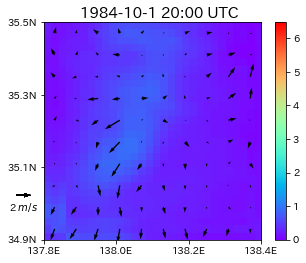

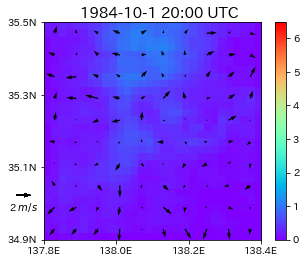

...

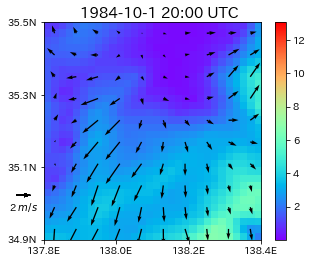

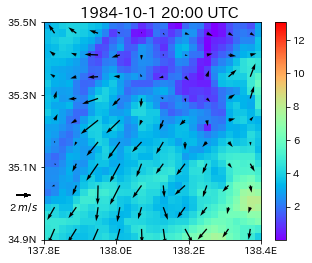

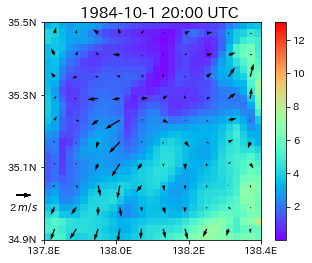

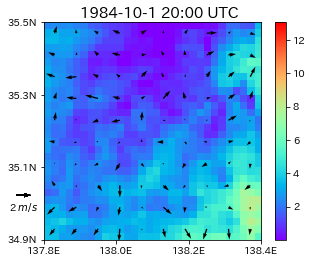

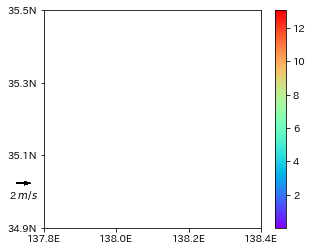

In [ ]:
# ×→○
start, end = 722, 742
times = [f'1984-10-1 {time}:00 UTC' for time in range(1,21)]
nets = ['true', 'input', 'MLP', 'SRCNN', 'UNet', 'SE-SRResNet']
variables = ['P', 'T', 'R']
X = [list(range(1,30,3)) for _ in range(1,30,3)]
Y = [[_]*10 for _ in range(1,30,3)]
for k,variable in enumerate(variables):
  for j,net in enumerate(nets):
    fig = plt.figure(figsize=(5,4))
    ax = fig.add_subplot(111)
    pmin, pmax, ims = data[start:end,900*k:900*(k+1)].min(), data[start:end,900*k:900*(k+1)].max(), []
    im = ax.imshow(np.zeros((30,30)), cmap='gray', animated=True, vmin=pmin, vmax=pmax)
    ims.append([im])
    for i,t in enumerate(times):
      im = ax.imshow(data[i+start,6300*j+900*k:6300*j+900*(k+1)].reshape((30,30))[::-1], cmap='rainbow', animated=True, vmin=pmin, vmax=pmax)
      im2 = ax.quiver(X, Y, data[i+start,j*6300+2700:j*6300+3600].reshape((30,30))[1::3,1::3], -data[i+start,j*6300+3600:j*6300+4500].reshape((30,30))[28::-3,1::3], animated=True, angles='xy', scale_units='xy', scale=1)
      if i==0:
        plt.quiverkey(im2, 0.085, 0.28, 2, '2 $m/s$', labelpos='S', coordinates='figure', labelsep=0.08)
        cbar = fig.colorbar(im, ax=ax)
        cbar.min, cbar.max = pmin, pmax
      ax.set_xticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_xticklabels(['137.8E','138.0E','138.2E','138.4E'])
      ax.set_yticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_yticklabels(['35.5N','35.3N','35.1N','34.9N'])
      im3 = ax.text(4.5, -1.1, t, animated=True, fontsize=15)
      ims.append([im,im2,im3])
    ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000)
    ani.save(f'{BASE_DIR}/images/sample{variable}_{net}_rainbow_84-10-1-1_84-10-1-20.gif', writer='pillow')

### ×→×

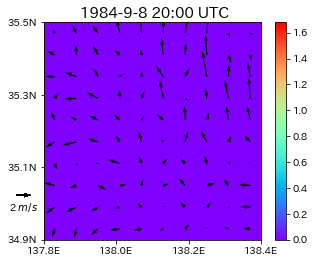

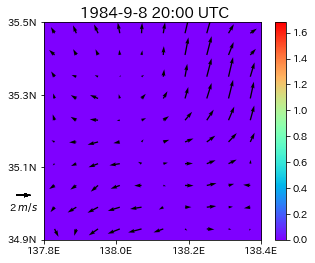

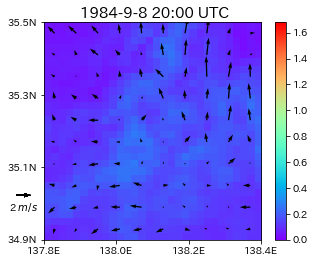

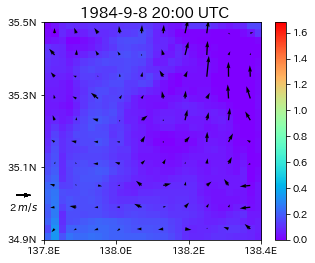

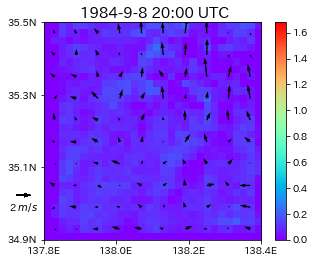

...

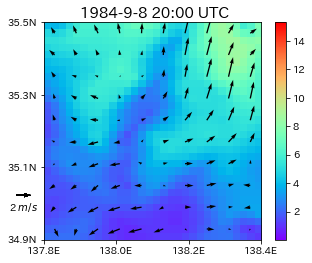

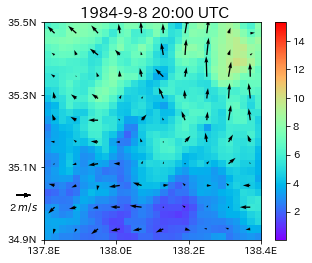

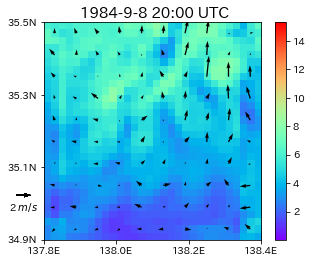

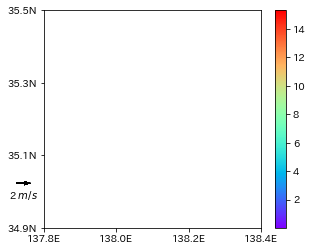

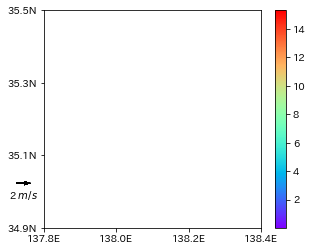

In [ ]:
# ×→×
start, end = 170, 190
times = [f'1984-9-8 {time}:00 UTC' for time in range(1,21)]
nets = ['true', 'input', 'MLP', 'SRCNN', 'UNet', 'SE-SRResNet']
variables = ['P', 'T', 'R']
X = [list(range(1,30,3)) for _ in range(1,30,3)]
Y = [[_]*10 for _ in range(1,30,3)]
for k,variable in enumerate(variables):
  for j,net in enumerate(nets):
    fig = plt.figure(figsize=(5,4))
    ax = fig.add_subplot(111)
    if k==0:
      pmin, pmax, ims = 0, 1.68, []
    else:
      pmin, pmax, ims = data[start:end,900*k:900*(k+1)].min(), data[start:end,900*k:900*(k+1)].max(), []
    im = ax.imshow(np.zeros((30,30)), cmap='gray', animated=True, vmin=pmin, vmax=pmax)
    ims.append([im])
    for i,t in enumerate(times):
      im = ax.imshow(data[i+start,6300*j+900*k:6300*j+900*(k+1)].reshape((30,30))[::-1], cmap='rainbow', animated=True, vmin=pmin, vmax=pmax)
      im2 = ax.quiver(X, Y, data[i+start,j*6300+2700:j*6300+3600].reshape((30,30))[1::3,1::3], -data[i+start,j*6300+3600:j*6300+4500].reshape((30,30))[28::-3,1::3], animated=True, angles='xy', scale_units='xy', scale=1)
      if i==0:
        plt.quiverkey(im2, 0.085, 0.28, 2, '2 $m/s$', labelpos='S', coordinates='figure', labelsep=0.08)
        cbar = fig.colorbar(im, ax=ax)
        cbar.min, cbar.max = pmin, pmax
      ax.set_xticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_xticklabels(['137.8E','138.0E','138.2E','138.4E'])
      ax.set_yticks(ticks=[-0.5,9.5,19.5,29.5])
      ax.set_yticklabels(['35.5N','35.3N','35.1N','34.9N'])
      im3 = ax.text(4.5, -1.1, t, animated=True, fontsize=15)
      ims.append([im,im2,im3])
    ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000)
    ani.save(f'{BASE_DIR}/images/sample{variable}_{net}_rainbow_84-9-8-1_84-9-8-20.gif', writer='pillow')

## ヒストグラム

### 降水量(P)

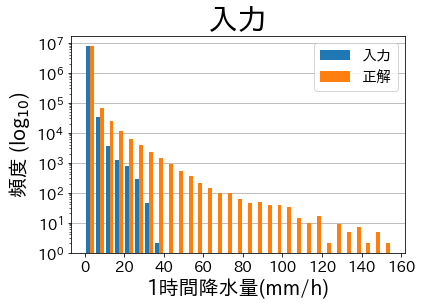

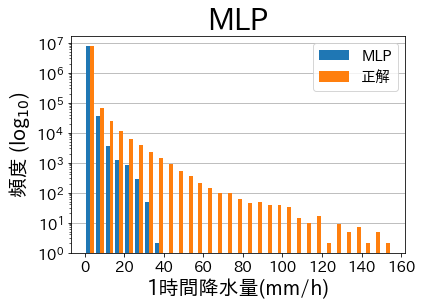

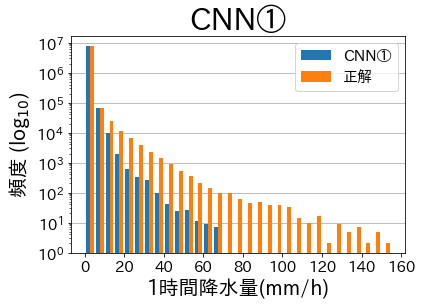

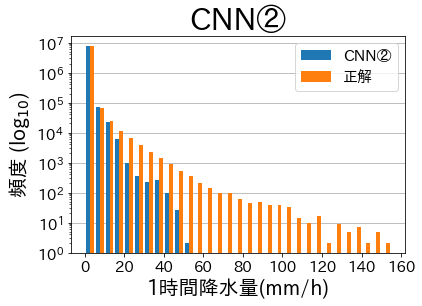

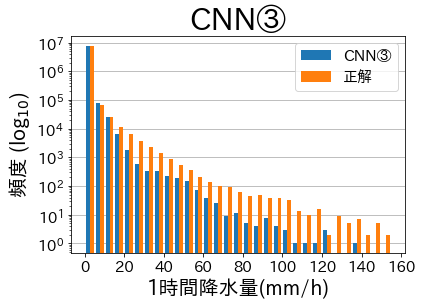

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = range(0, 156, 5)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300:(i+1)*6300+900].reshape(-1), data[:,:900].reshape(-1)], bins=edges, rwidth=0.8)
  # plt.hist(data[:,:900].reshape(-1), bins=edges, rwidth=0.8)
  plt.yscale('log')
  plt.xlabel('1時間降水量(mm/h)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度 (log$_{10}$)', fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.grid(axis='y')
  plt.legend([title, titles[0]], fontsize=15)
  plt.show()

### 気温(T)

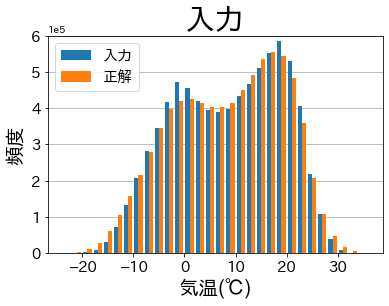

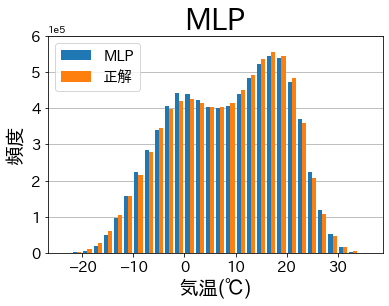

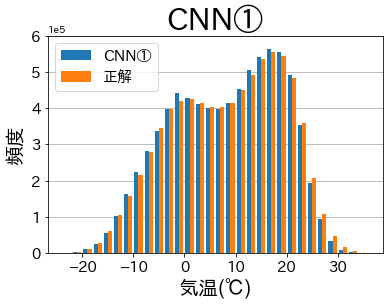

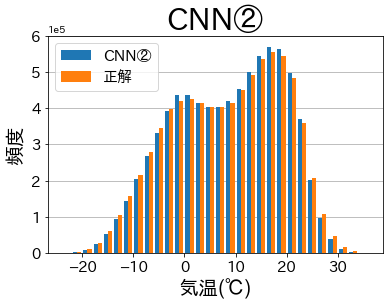

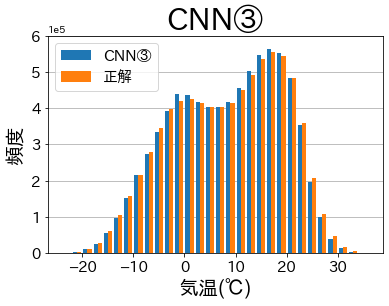

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = range(-24, 38, 2)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300+900:(i+1)*6300+1800].reshape(-1) - 273.15, data[:,900:1800].reshape(-1) - 273.15], bins=edges, rwidth=0.8)
  # plt.hist(data[:,:900].reshape(-1), bins=edges, rwidth=0.8)
  # plt.yscale('log')
  plt.xlabel('気温(℃)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度', fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.ylim(0,600000)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.ticklabel_format(style="sci", axis="y", scilimits=(0,0))
  plt.grid(axis='y')
  plt.legend([title, titles[0]], loc='upper left', fontsize=15)
  plt.show()

### 湿度(R)

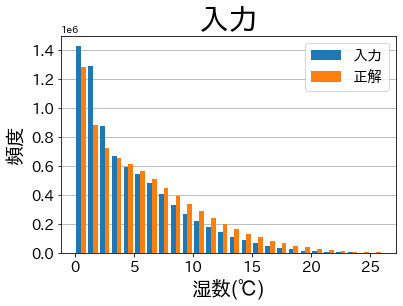

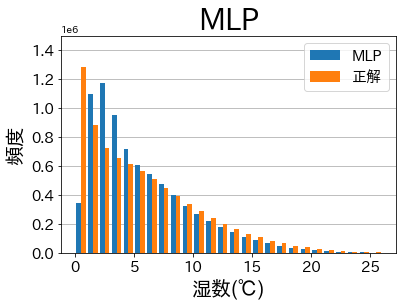

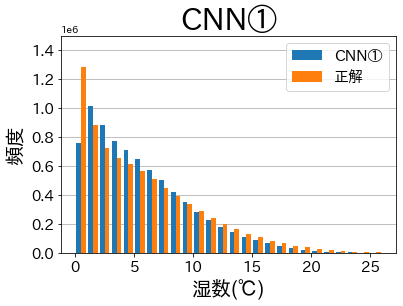

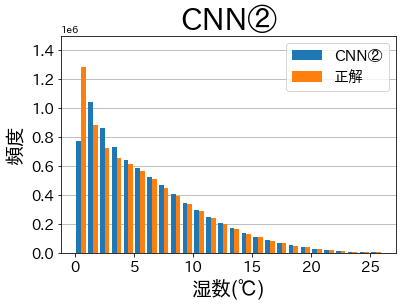

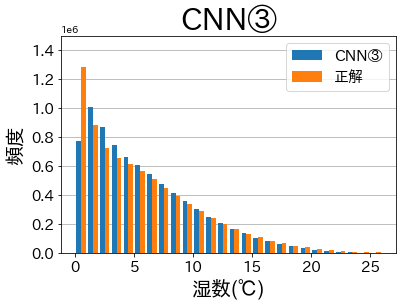

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = range(0, 27, 1)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300+1800:(i+1)*6300+2700].reshape(-1), data[:,1800:2700].reshape(-1)], bins=edges, rwidth=0.8)
  # plt.hist(data[:,:900].reshape(-1), bins=edges, rwidth=0.8)
  # plt.yscale('log')
  plt.xlabel('湿数(℃)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度', fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.ylim(0,1500000)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.ticklabel_format(style="sci", axis="y", scilimits=(0,0))
  plt.grid(axis='y')
  plt.legend([title, titles[0]], loc='upper right', fontsize=15)
  plt.show()

### 東西風(U)

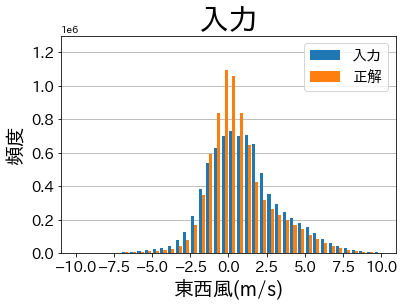

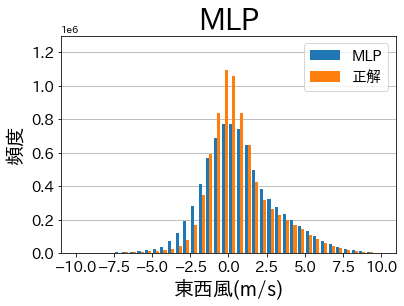

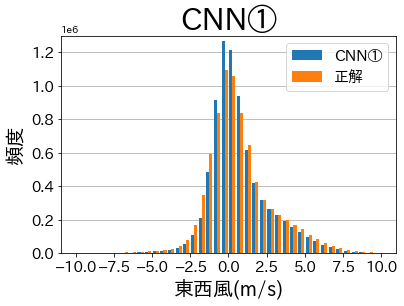

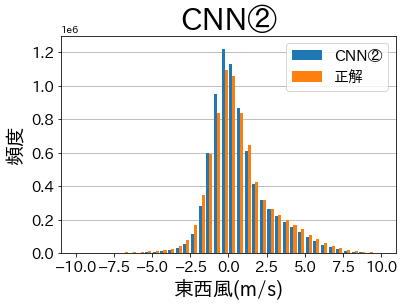

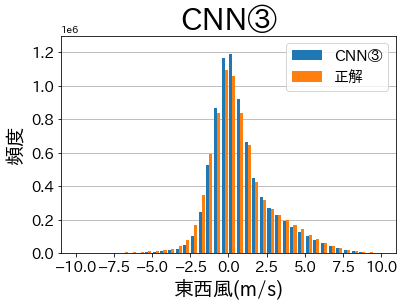

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = np.arange(-10, 10.5, 0.5)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300+2700:(i+1)*6300+3600].reshape(-1), data[:,2700:3600].reshape(-1)], bins=edges, rwidth=0.8)
  # plt.hist(data[:,:900].reshape(-1), bins=edges, rwidth=0.8)
  # plt.yscale('log')
  plt.xlabel('東西風(m/s)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度', fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.ylim(0,1300000)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.ticklabel_format(style="sci", axis="y", scilimits=(0,0))
  plt.grid(axis='y')
  plt.legend([title, titles[0]], loc='upper right', fontsize=15)
  plt.show()

### 南北風(V)

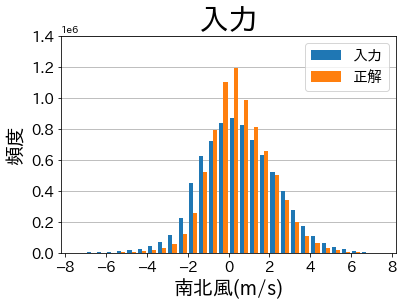

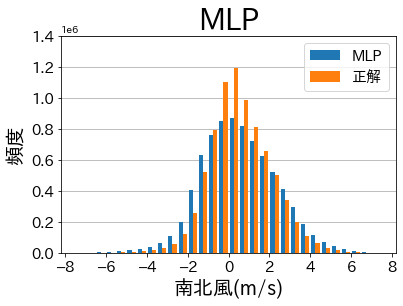

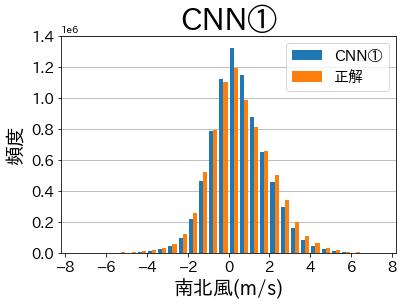

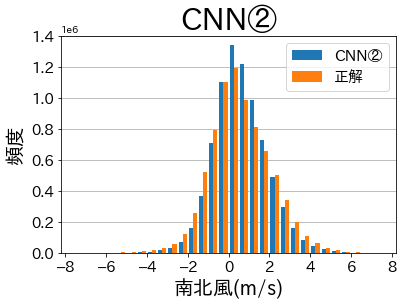

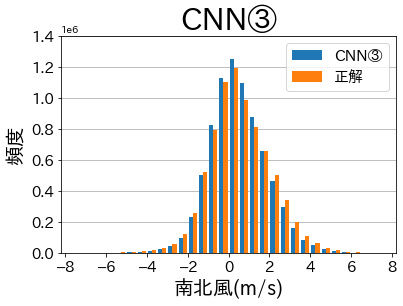

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = np.arange(-7.5, 8, 0.5)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300+3600:(i+1)*6300+4500].reshape(-1), data[:,3600:4500].reshape(-1)], bins=edges, rwidth=0.8)
  # plt.hist(data[:,:900].reshape(-1), bins=edges, rwidth=0.8)
  # plt.yscale('log')
  plt.xlabel('南北風(m/s)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度', fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.ylim(0,1400000)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.ticklabel_format(style="sci", axis="y", scilimits=(0,0))
  plt.grid(axis='y')
  plt.legend([title, titles[0]], loc='upper right', fontsize=15)
  plt.show()

### 風速(W)

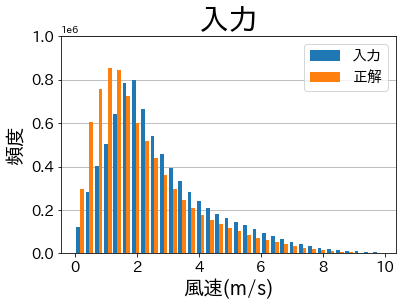

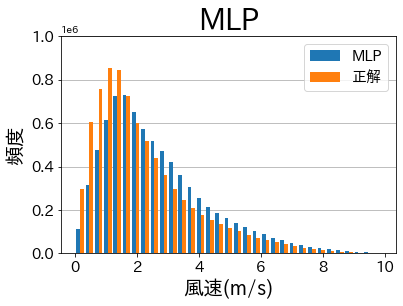

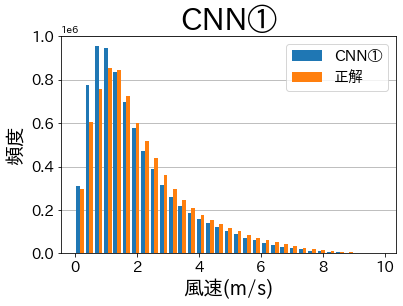

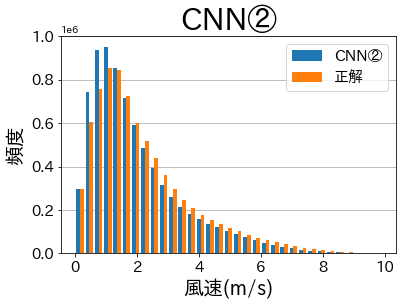

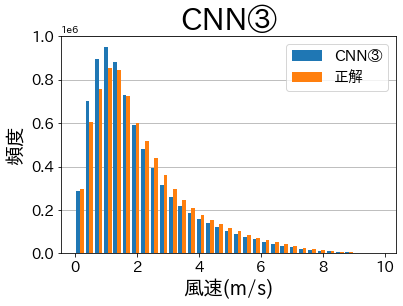

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = np.arange(0, 10, 0.3)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300+4500:(i+1)*6300+5400].reshape(-1), data[:,4500:5400].reshape(-1)], bins=edges, rwidth=0.8)
  # plt.yscale('log')
  plt.xlabel('風速(m/s)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度', fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.ylim(0,1000000)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.ticklabel_format(style="sci", axis="y", scilimits=(0,0))
  plt.grid(axis='y')
  plt.legend([title, titles[0]], loc='upper right', fontsize=15)
  plt.show()

### 風向(D)

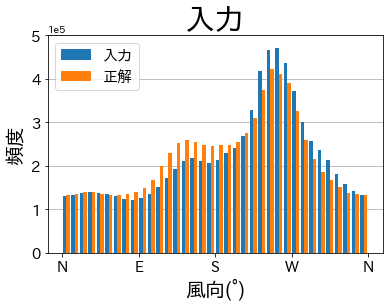

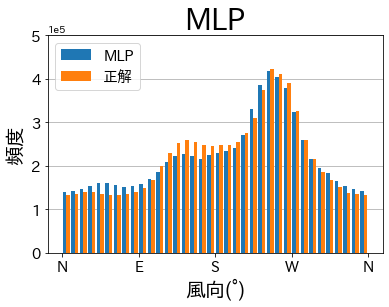

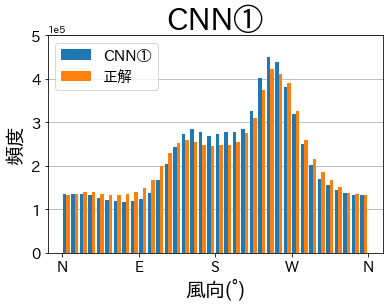

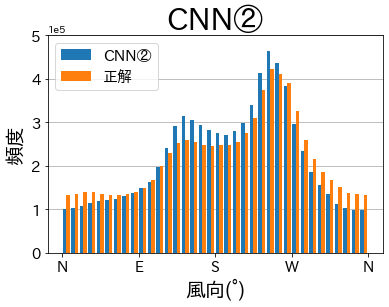

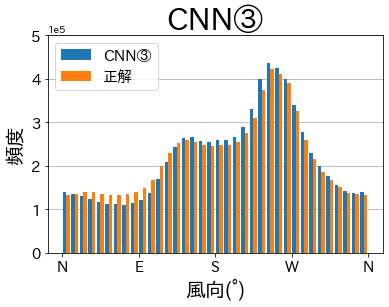

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
edges = np.arange(0, 361, 10)
for i, title in enumerate(titles[1:]):
  plt.hist([data[:,(i+1)*6300+5400:(i+1)*6300+6300].reshape(-1), data[:,5400:6300].reshape(-1)], bins=edges, rwidth=0.8)
  # plt.yscale('log')
  plt.xlabel('風向(°)', fontsize=20)# Precipitation Per Hour
  plt.ylabel('頻度', fontsize=20)# Frequency
  plt.xticks([0,90,180,270,360], ['N', 'E', 'S', 'W', 'N'], fontsize=15)
  plt.yticks(fontsize=15)
  plt.ylim(0,500000)
  plt.title(title, fontsize=30)
  plt.rcParams['axes.axisbelow'] = True
  plt.ticklabel_format(style="sci", axis="y", scilimits=(0,0))
  plt.grid(axis='y')
  plt.legend([title, titles[0]], loc='upper left', fontsize=15)
  plt.show()

## 時系列グラフ

### 降水量(P)

#### 領域合計降水量

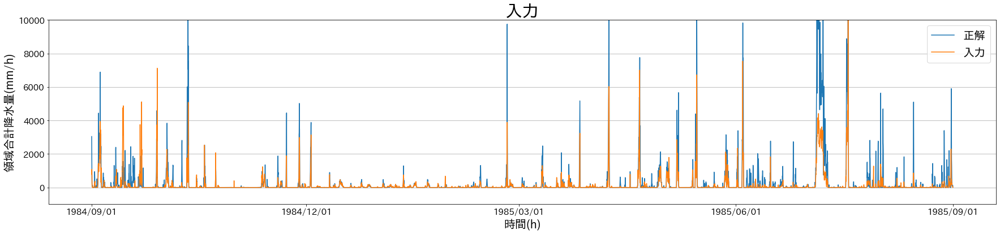

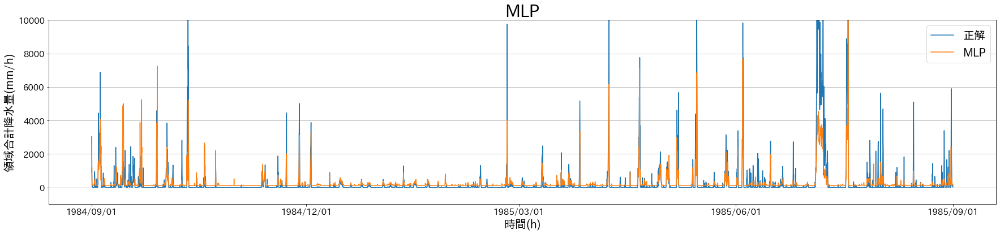

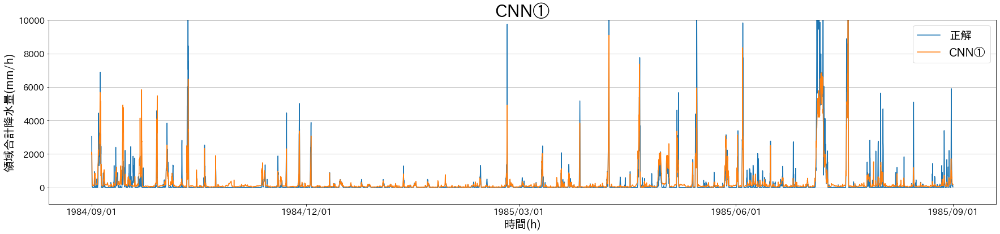

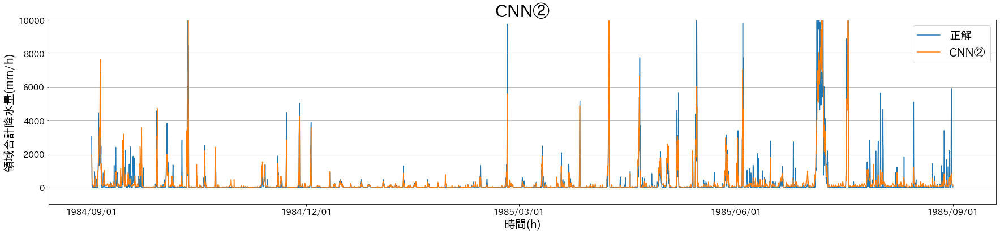

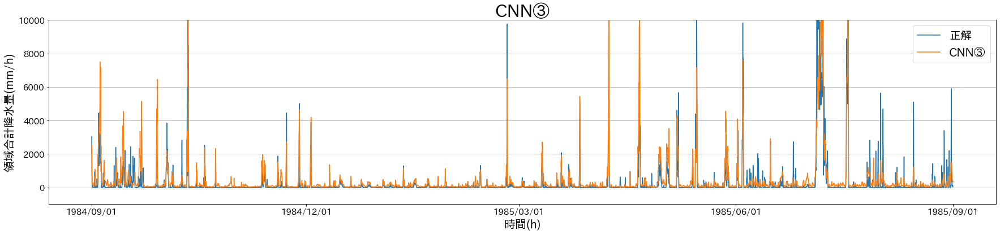

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
for i, title in enumerate(titles[1:]):
  plt.figure(figsize=(30,6))
  plt.plot(data[:,:900].sum(axis=1))
  plt.plot(data[:,(i+1)*6300:(i+1)*6300+900].sum(axis=1))
  plt.xticks(ticks=[0,2184,4344,6552,8760], labels=['1984/09/01', '1984/12/01', '1985/03/01', '1985/06/01', '1985/09/01'], fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlabel('時間(h)', fontsize=20)
  plt.ylabel('領域合計降水量(mm/h)', fontsize=20)
  plt.ylim(-1000,10000)
  plt.title(title, fontsize=30)
  plt.grid(axis='y')
  plt.legend([titles[0], title], fontsize=20)
  plt.show()

### 気温(T)

#### 領域平均気温

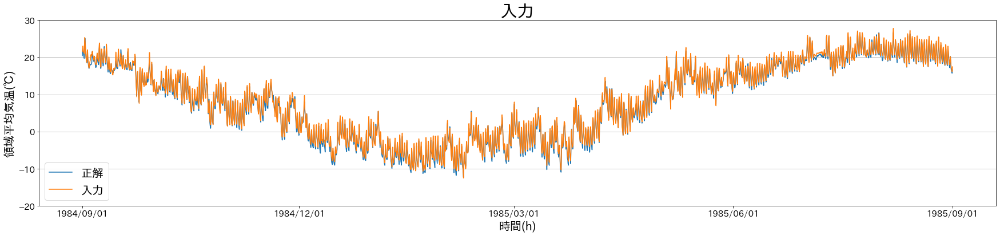

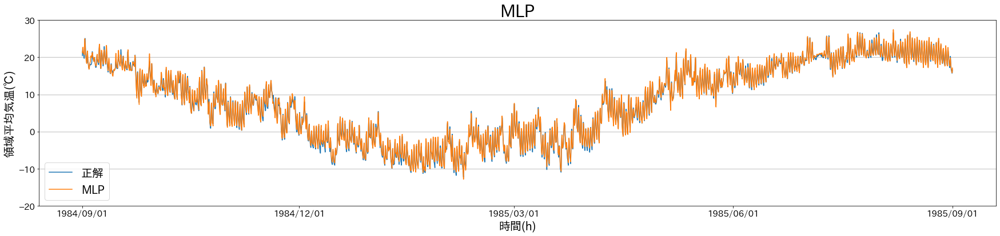

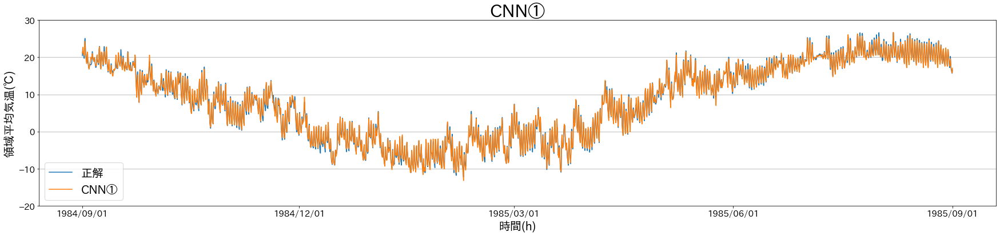

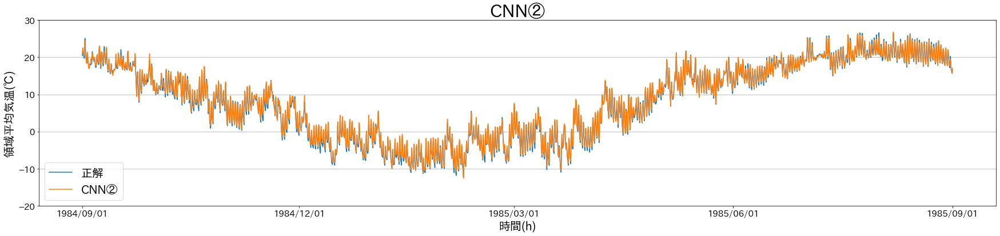

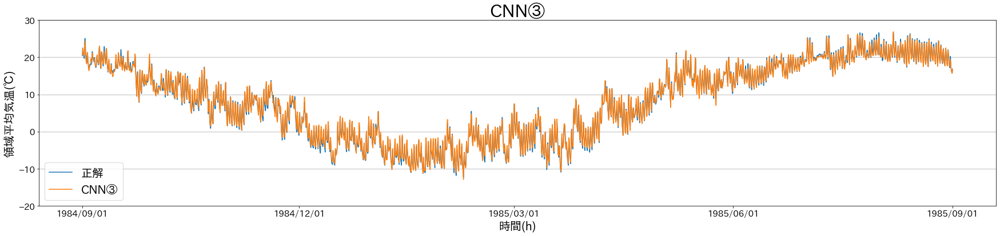

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
for i, title in enumerate(titles[1:]):
  plt.figure(figsize=(30,6))
  plt.plot(data[:,900:1800].mean(axis=1)-273.15)
  plt.plot(data[:,(i+1)*6300+900:(i+1)*6300+1800].mean(axis=1)-273.15)
  plt.xticks(ticks=[0,2184,4344,6552,8760], labels=['1984/09/01', '1984/12/01', '1985/03/01', '1985/06/01', '1985/09/01'], fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlabel('時間(h)', fontsize=20)
  plt.ylabel('領域平均気温(℃)', fontsize=20)
  plt.ylim(-20,30)
  plt.title(title, fontsize=30)
  plt.grid(axis='y')
  plt.legend([titles[0], title], fontsize=20)
  plt.show()

### 湿数(R)

#### 領域平均湿数

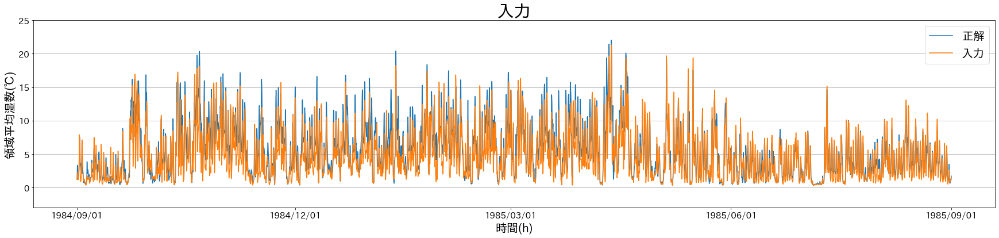

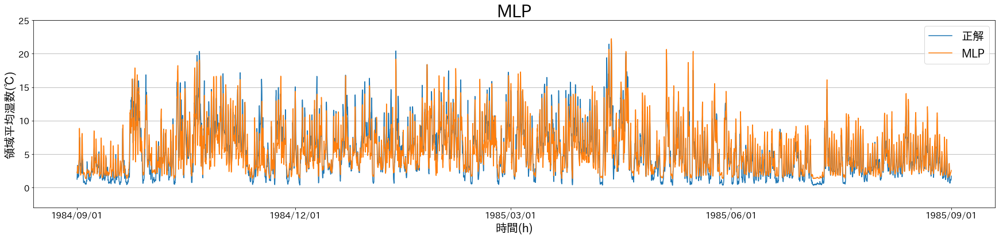

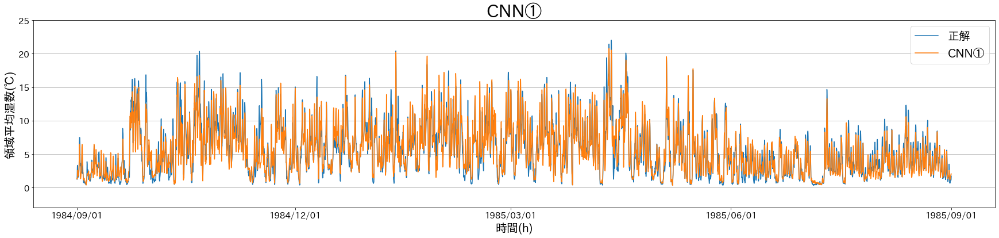

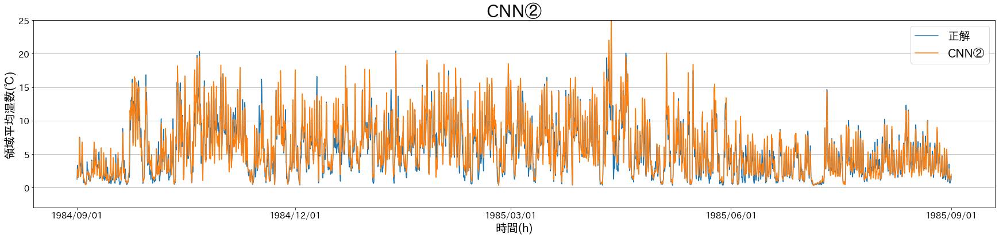

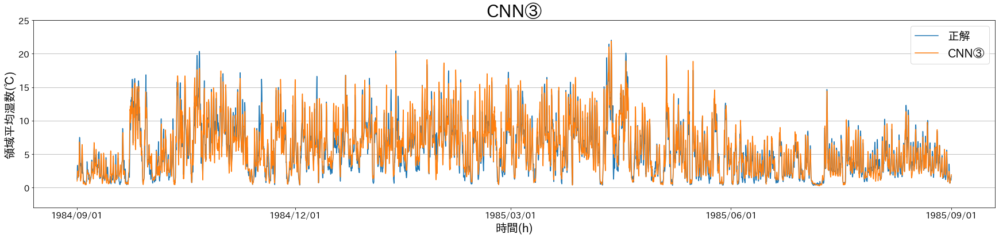

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
for i, title in enumerate(titles[1:]):
  plt.figure(figsize=(30,6))
  plt.plot(data[:,1800:2700].mean(axis=1))
  plt.plot(data[:,(i+1)*6300+1800:(i+1)*6300+2700].mean(axis=1))
  plt.xticks(ticks=[0,2184,4344,6552,8760], labels=['1984/09/01', '1984/12/01', '1985/03/01', '1985/06/01', '1985/09/01'], fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlabel('時間(h)', fontsize=20)
  plt.ylabel('領域平均湿数(℃)', fontsize=20)
  plt.ylim(-3,25)
  plt.title(title, fontsize=30)
  plt.grid(axis='y')
  plt.legend([titles[0], title], fontsize=20)
  plt.show()

### 風速(W)

#### 領域平均風速

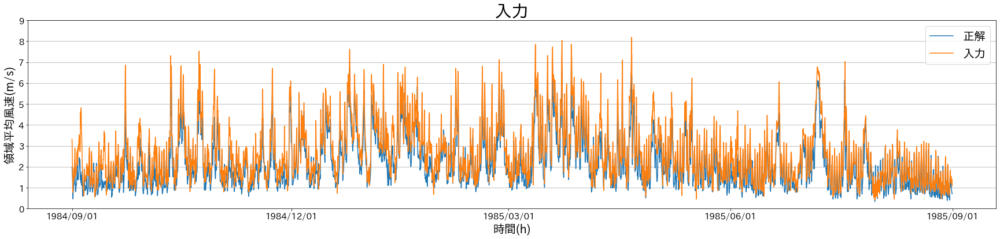

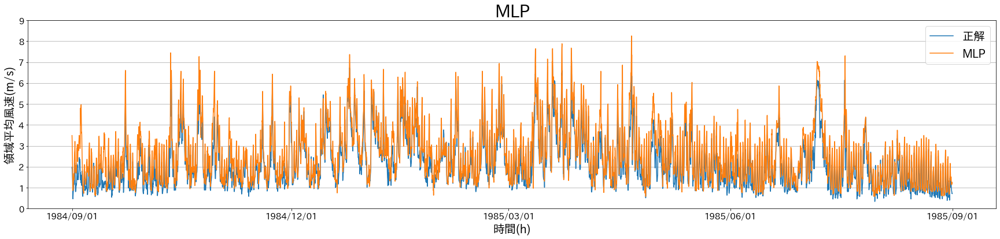

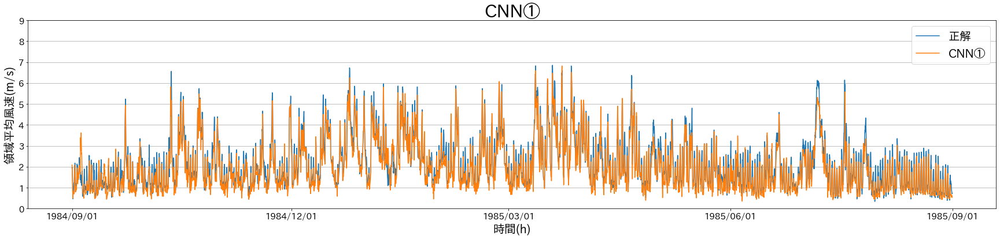

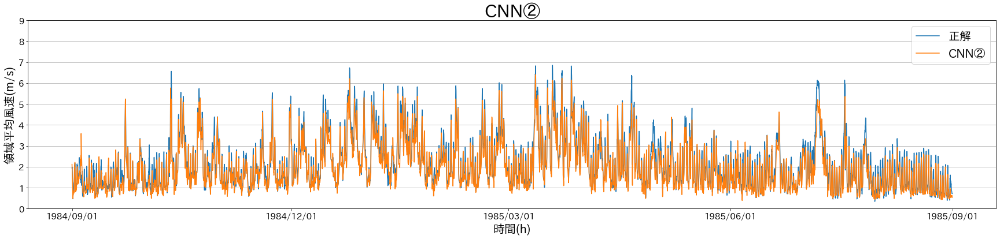

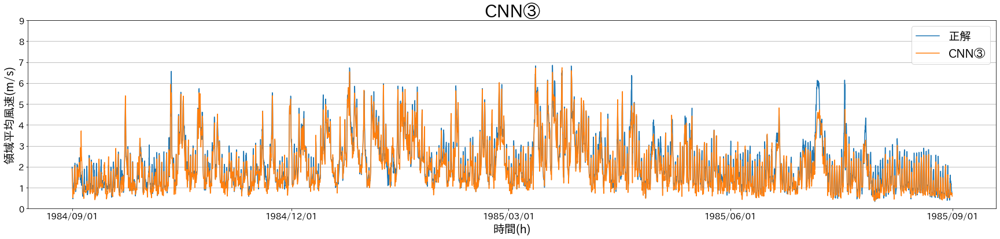

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
for i, title in enumerate(titles[1:]):
  plt.figure(figsize=(30,6))
  plt.plot(data[:,4500:5400].mean(axis=1))
  plt.plot(data[:,(i+1)*6300+4500:(i+1)*6300+5400].mean(axis=1))
  plt.xticks(ticks=[0,2184,4344,6552,8760], labels=['1984/09/01', '1984/12/01', '1985/03/01', '1985/06/01', '1985/09/01'], fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlabel('時間(h)', fontsize=20)
  plt.ylabel('領域平均風速(m/s)', fontsize=20)
  plt.ylim(0,9)
  plt.title(title, fontsize=30)
  plt.grid(axis='y')
  plt.legend([titles[0], title], fontsize=20)
  plt.show()

#### 領域最大風速

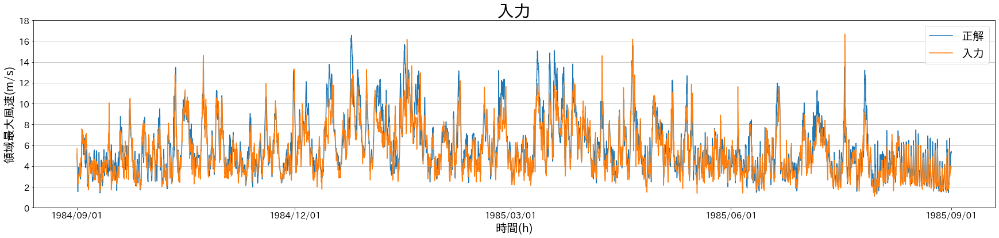

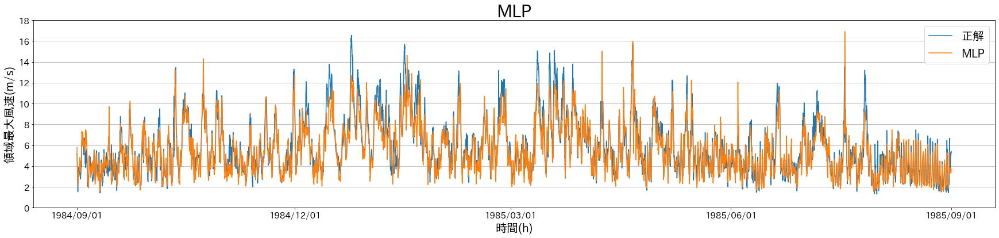

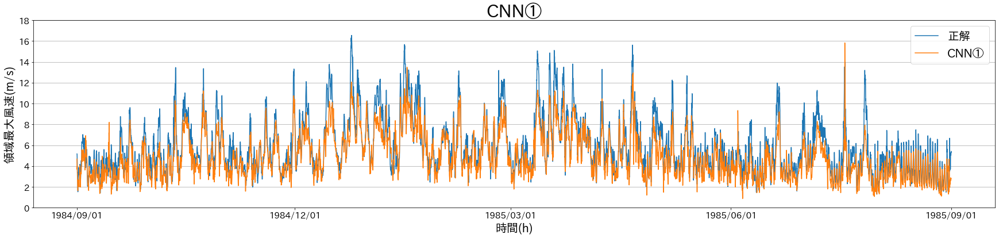

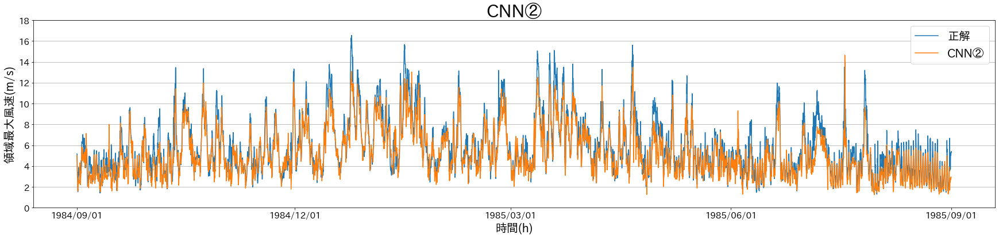

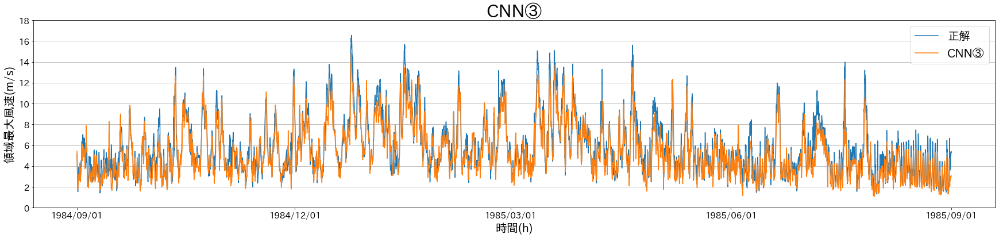

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
for i, title in enumerate(titles[1:]):
  plt.figure(figsize=(30,6))
  plt.plot(data[:,4500:5400].max(axis=1))
  plt.plot(data[:,(i+1)*6300+4500:(i+1)*6300+5400].max(axis=1))
  plt.xticks(ticks=[0,2184,4344,6552,8760], labels=['1984/09/01', '1984/12/01', '1985/03/01', '1985/06/01', '1985/09/01'], fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlabel('時間(h)', fontsize=20)
  plt.ylabel('領域最大風速(m/s)', fontsize=20)
  plt.ylim(0,18)
  plt.title(title, fontsize=30)
  plt.grid(axis='y')
  plt.legend([titles[0], title], fontsize=20, loc='upper right')
  plt.show()

## 日変動グラフ

### 気温(T)

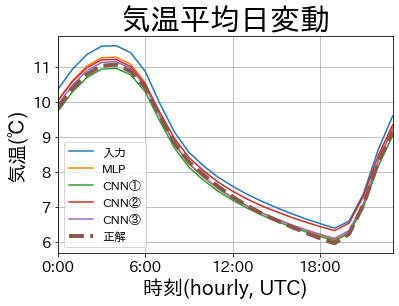

In [ ]:
plt.plot([data[i::24,6300+900:6300+1800].mean() - 273.15 for i in range(24)], label='入力')
plt.plot([data[i::24,6300*2+900:6300*2+1800].mean() - 273.15 for i in range(24)], label='MLP')
plt.plot([data[i::24,6300*3+900:6300*3+1800].mean() - 273.15 for i in range(24)], label='CNN①')
plt.plot([data[i::24,6300*4+900:6300*4+1800].mean() - 273.15 for i in range(24)], label='CNN②')
plt.plot([data[i::24,6300*5+900:6300*5+1800].mean() - 273.15 for i in range(24)], label='CNN③')
plt.plot([data[i::24,900:1800].mean() - 273.15 for i in range(24)], label='正解', linewidth=4, linestyle='--')
plt.xticks([0,6,12,18,24], ['0:00', '6:00', '12:00', '18:00', '24:00'], fontsize=15)
plt.xlim(0,23)
plt.xlabel('時刻(hourly, UTC)', fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('気温(℃)', fontsize=20)
plt.title('気温平均日変動', fontsize=30)
plt.legend(fontsize=12)
plt.grid()
plt.show()

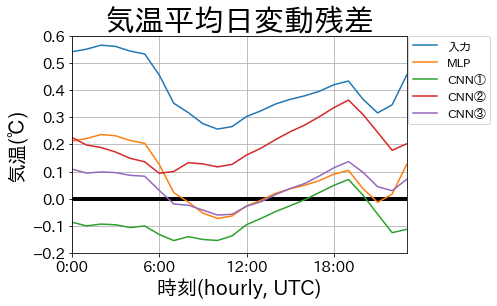

In [ ]:
plt.plot(range(0,24), [0]*24, color='black', linewidth=4)
plt.plot([data[i::24,6300+900:6300+1800].mean() - data[i::24,900:1800].mean() for i in range(24)], label='入力')
plt.plot([data[i::24,6300*2+900:6300*2+1800].mean() - data[i::24,900:1800].mean() for i in range(24)], label='MLP')
plt.plot([data[i::24,6300*3+900:6300*3+1800].mean() - data[i::24,900:1800].mean() for i in range(24)], label='CNN①')
plt.plot([data[i::24,6300*4+900:6300*4+1800].mean() - data[i::24,900:1800].mean() for i in range(24)], label='CNN②')
plt.plot([data[i::24,6300*5+900:6300*5+1800].mean() - data[i::24,900:1800].mean() for i in range(24)], label='CNN③')
plt.xticks([0,6,12,18,24], ['0:00', '6:00', '12:00', '18:00', '24:00'], fontsize=15)
plt.xlim(0,23)
plt.xlabel('時刻(hourly, UTC)', fontsize=20)
plt.yticks(fontsize=15)
plt.ylim(-0.2,0.6)
plt.ylabel('気温(℃)', fontsize=20)
plt.title('気温平均日変動残差', fontsize=30)
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.005,1.), borderaxespad=0)
plt.grid()
plt.show()

### 湿数(R)

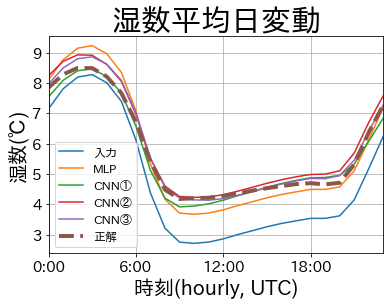

In [ ]:
plt.plot([data[i::24,6300+1800:6300+2700].mean() for i in range(24)], label='入力')
plt.plot([data[i::24,6300*2+1800:6300*2+2700].mean() for i in range(24)], label='MLP')
plt.plot([data[i::24,6300*3+1800:6300*3+2700].mean() for i in range(24)], label='CNN①')
plt.plot([data[i::24,6300*4+1800:6300*4+2700].mean() for i in range(24)], label='CNN②')
plt.plot([data[i::24,6300*5+1800:6300*5+2700].mean() for i in range(24)], label='CNN③')
plt.plot([data[i::24,1800:2700].mean() for i in range(24)], label='正解', linewidth=4, linestyle='--')
plt.xticks([0,6,12,18,24], ['0:00', '6:00', '12:00', '18:00', '24:00'], fontsize=15)
plt.xlim(0,23)
plt.xlabel('時刻(hourly, UTC)', fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('湿数(℃)', fontsize=20)
plt.title('湿数平均日変動', fontsize=30)
plt.legend(fontsize=12, loc='lower left')
plt.grid()
plt.show()

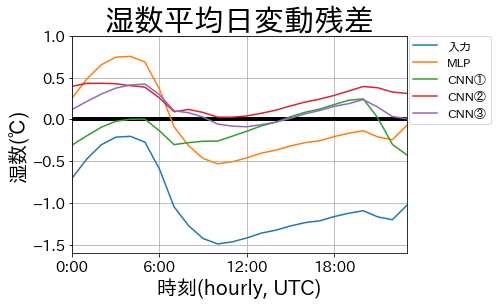

In [ ]:
plt.plot(range(0,24), [0]*24, color='black', linewidth=4)
plt.plot([data[i::24,6300+1800:6300+2700].mean() - data[i::24,1800:2700].mean() for i in range(24)], label='入力')
plt.plot([data[i::24,6300*2+1800:6300*2+2700].mean() - data[i::24,1800:2700].mean() for i in range(24)], label='MLP')
plt.plot([data[i::24,6300*3+1800:6300*3+2700].mean() - data[i::24,1800:2700].mean() for i in range(24)], label='CNN①')
plt.plot([data[i::24,6300*4+1800:6300*4+2700].mean() - data[i::24,1800:2700].mean() for i in range(24)], label='CNN②')
plt.plot([data[i::24,6300*5+1800:6300*5+2700].mean() - data[i::24,1800:2700].mean() for i in range(24)], label='CNN③')
plt.xticks([0,6,12,18,24], ['0:00', '6:00', '12:00', '18:00', '24:00'], fontsize=15)
plt.xlim(0,23)
plt.xlabel('時刻(hourly, UTC)', fontsize=20)
plt.ylim(-1.6,1)
plt.yticks(fontsize=15)
plt.ylabel('湿数(℃)', fontsize=20)
plt.title('湿数平均日変動残差', fontsize=30)
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.005,1.), borderaxespad=0)
plt.grid()
plt.show()

### 風速(W)

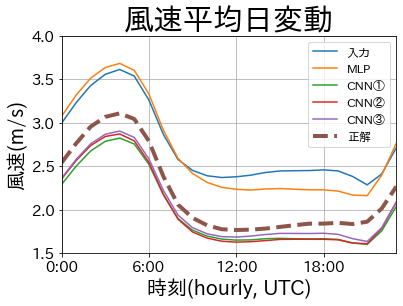

In [ ]:
plt.plot([data[i::24,6300+4500:6300+5400].mean() for i in range(24)], label='入力')
plt.plot([data[i::24,6300*2+4500:6300*2+5400].mean() for i in range(24)], label='MLP')
plt.plot([data[i::24,6300*3+4500:6300*3+5400].mean() for i in range(24)], label='CNN①')
plt.plot([data[i::24,6300*4+4500:6300*4+5400].mean() for i in range(24)], label='CNN②')
plt.plot([data[i::24,6300*5+4500:6300*5+5400].mean() for i in range(24)], label='CNN③')
plt.plot([data[i::24,4500:5400].mean() for i in range(24)], label='正解', linewidth=4, linestyle='--')
plt.xticks([0,6,12,18,24], ['0:00', '6:00', '12:00', '18:00', '24:00'], fontsize=15)
plt.xlim(0,23)
plt.xlabel('時刻(hourly, UTC)', fontsize=20)
plt.ylim(1.5, 4)
plt.yticks(fontsize=15)
plt.ylabel('風速(m/s)', fontsize=20)
plt.title('風速平均日変動', fontsize=30)
plt.legend(fontsize=12, loc='upper right')
plt.grid()
plt.show()

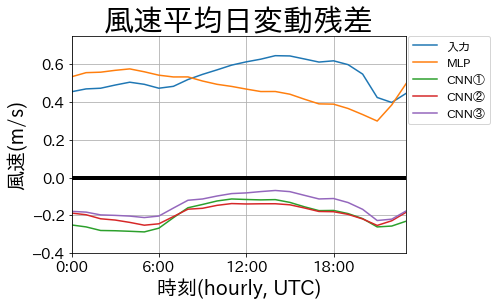

In [ ]:
plt.plot(range(0,24), [0]*24, color='black', linewidth=4)
plt.plot([data[i::24,6300+4500:6300+5400].mean() - data[i::24,4500:5400].mean() for i in range(24)], label='入力')
plt.plot([data[i::24,6300*2+4500:6300*2+5400].mean() - data[i::24,4500:5400].mean() for i in range(24)], label='MLP')
plt.plot([data[i::24,6300*3+4500:6300*3+5400].mean() - data[i::24,4500:5400].mean() for i in range(24)], label='CNN①')
plt.plot([data[i::24,6300*4+4500:6300*4+5400].mean() - data[i::24,4500:5400].mean() for i in range(24)], label='CNN②')
plt.plot([data[i::24,6300*5+4500:6300*5+5400].mean() - data[i::24,4500:5400].mean() for i in range(24)], label='CNN③')
plt.xticks([0,6,12,18,24], ['0:00', '6:00', '12:00', '18:00', '24:00'], fontsize=15)
plt.xlim(0,23)
plt.xlabel('時刻(hourly, UTC)', fontsize=20)
plt.ylim(-0.4, 0.75)
plt.yticks(fontsize=15)
plt.ylabel('風速(m/s)', fontsize=20)
plt.title('風速平均日変動残差', fontsize=30)
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.005,1.), borderaxespad=0)
plt.grid()
plt.show()

## 領域マップ

### 統計量

#### 降水量(P)

##### 時系列方向合計降水量

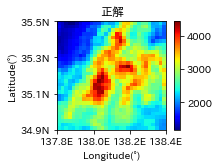

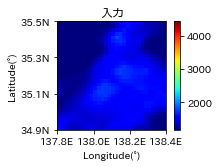

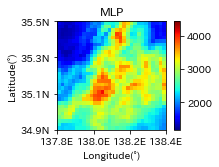

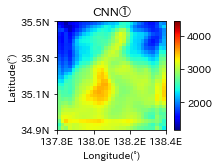

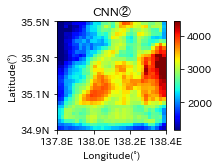

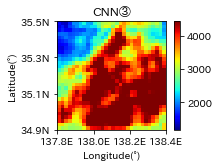

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,:900].sum(axis=0).min()
cmax = data[:,:900].sum(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i:6300*i+900].sum(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向最大降水量

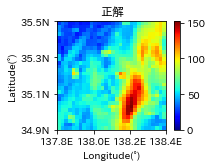

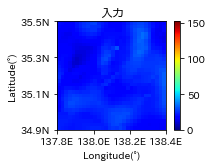

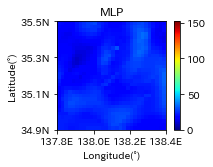

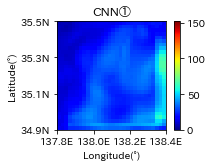

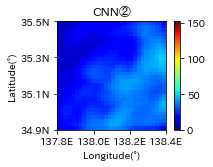

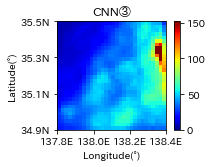

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = 0#data[:,:900].max(axis=0).min()
cmax = data[:,:900].max(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i:6300*i+900].max(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向降水量99.9%タイル値

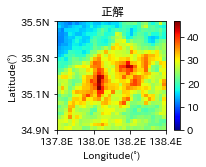

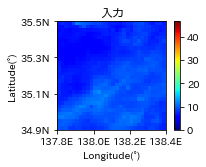

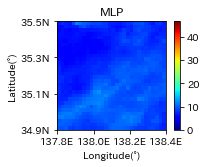

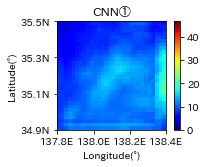

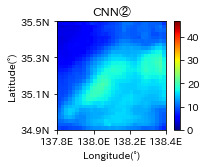

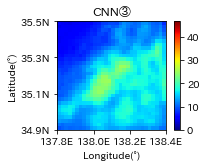

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = 0#np.percentile(data[:,:900], q=99.9, axis=0).min()
cmax = np.percentile(data[:,:900], q=99.9, axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.percentile(data[:,6300*i:6300*i+900], q=99.9, axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向降水量99%タイル値

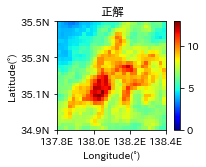

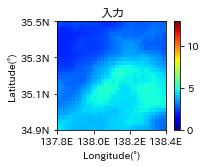

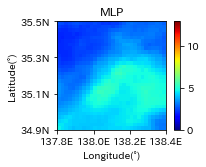

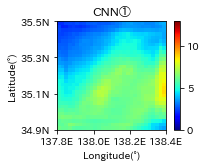

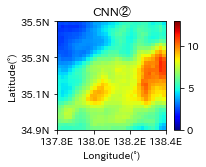

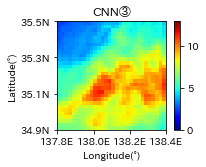

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = 0#np.percentile(data[:,:900], q=99, axis=0).min()
cmax = np.percentile(data[:,:900], q=99, axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.percentile(data[:,6300*i:6300*i+900], q=99, axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向降水量90%タイル値

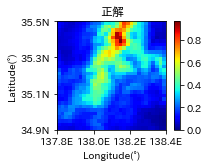

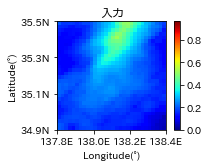

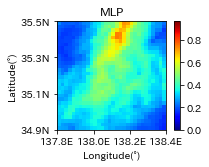

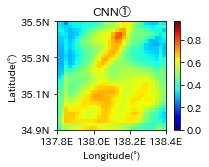

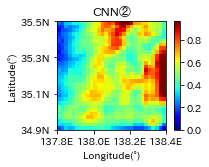

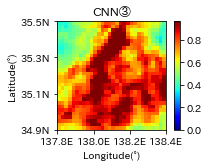

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = 0#np.percentile(data[:,:900], q=90, axis=0).min()
cmax = np.percentile(data[:,:900], q=90, axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.percentile(data[:,6300*i:6300*i+900], q=90, axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向降水量50%タイル値

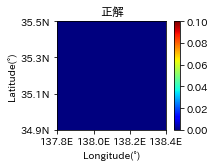

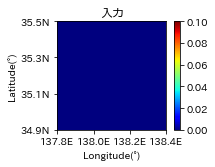

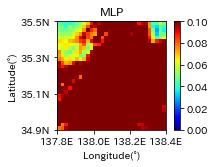

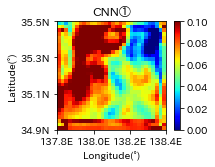

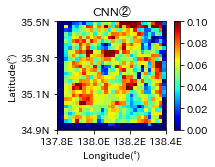

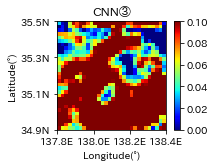

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = 0#np.percentile(data[:,:900], q=50, axis=0).min()
cmax = 0.1#np.percentile(data[:,:900], q=50, axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.percentile(data[:,6300*i:6300*i+900], q=50, axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 気温(T)

##### 時系列方向平均気温

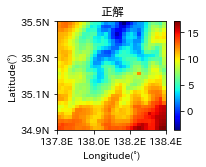

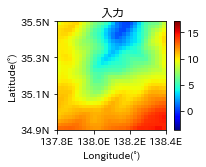

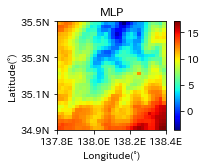

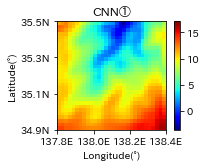

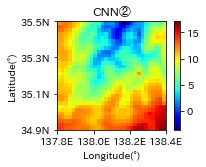

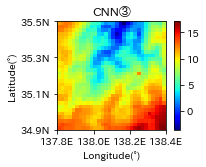

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,900:1800].mean(axis=0).min() - 273.15
cmax = data[:,900:1800].mean(axis=0).max() - 273.15
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+900:6300*i+1800].mean(axis=0).reshape((30,30))[::-1] - 273.15, cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向最高気温

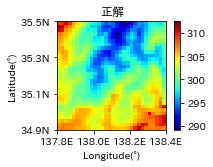

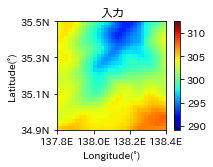

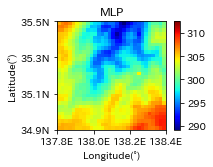

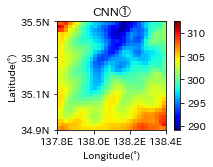

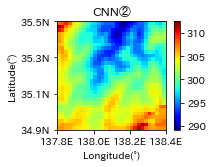

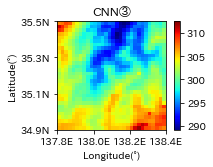

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,900:1800].max(axis=0).min()
cmax = data[:,900:1800].max(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+900:6300*i+1800].max(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向最低気温

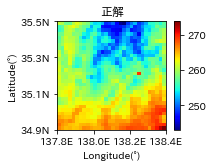

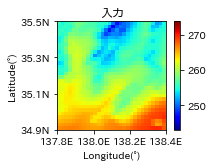

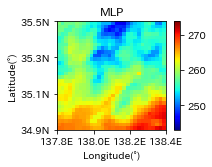

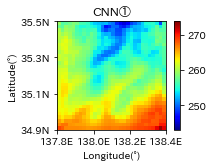

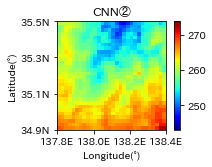

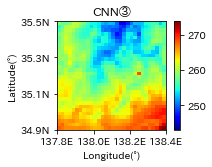

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,900:1800].min(axis=0).min()
cmax = data[:,900:1800].min(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+900:6300*i+1800].min(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 湿数(R)

##### 時系列方向平均湿数

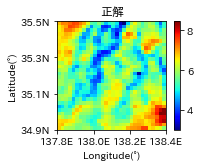

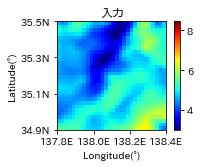

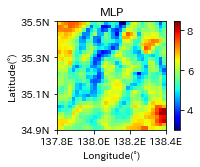

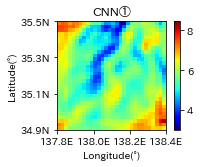

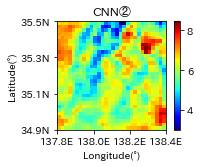

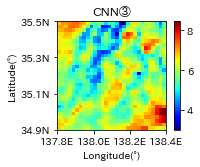

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,1800:2700].mean(axis=0).min()
cmax = data[:,1800:2700].mean(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+1800:6300*i+2700].mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向最高湿数

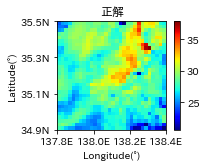

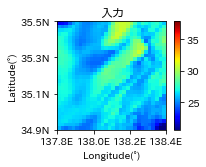

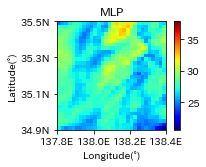

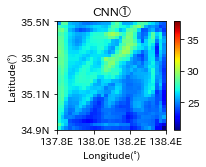

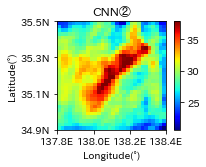

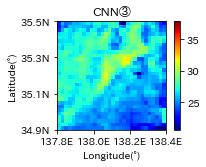

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,1800:2700].max(axis=0).min()
cmax = data[:,1800:2700].max(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+1800:6300*i+2700].max(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向最低湿数

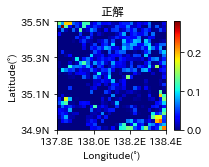

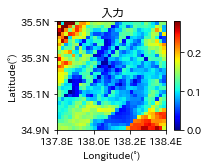

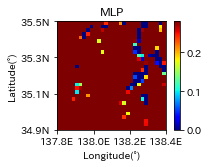

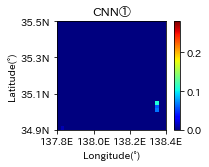

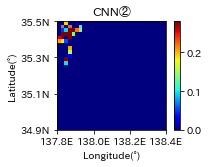

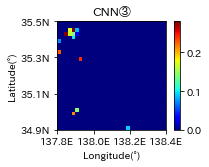

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,1800:2700].min(axis=0).min()
cmax = data[:,1800:2700].min(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+1800:6300*i+2700].min(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 東西風(U)

##### 時系列方向平均東西風

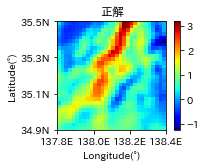

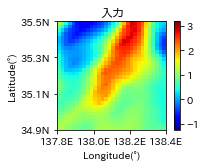

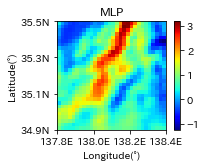

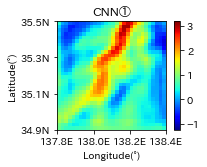

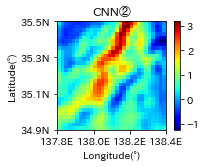

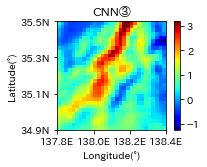

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,2700:3600].mean(axis=0).min()
cmax = data[:,2700:3600].mean(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+2700:6300*i+3600].mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 南北風(V)

##### 時系列方向平均南北風

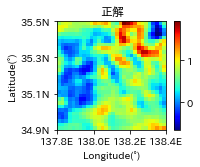

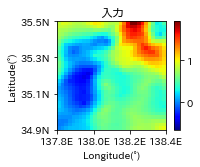

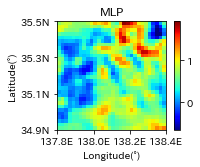

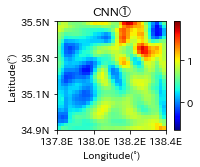

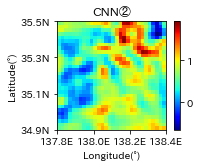

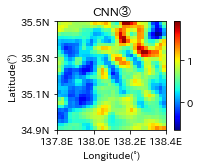

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,3600:4500].mean(axis=0).min()
cmax = data[:,3600:4500].mean(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+3600:6300*i+4500].mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 風速(W)

##### 時系列方向平均風速

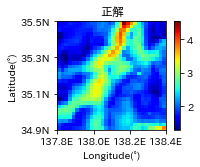

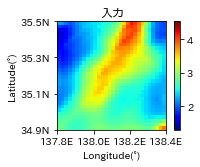

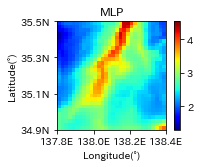

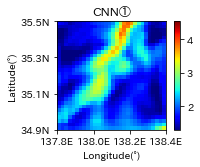

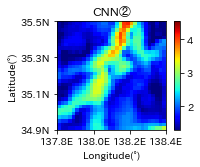

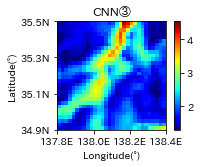

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,4500:5400].mean(axis=0).min()
cmax = data[:,4500:5400].mean(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+4500:6300*i+5400].mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

##### 時系列方向最大風速

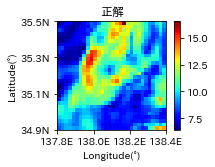

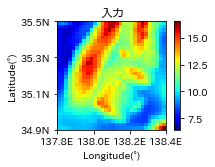

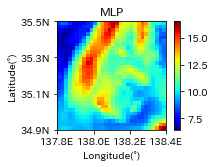

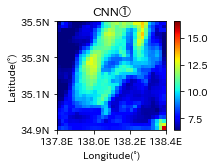

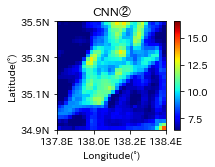

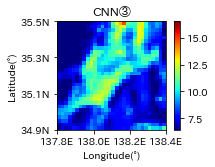

In [ ]:
# カラーバー範囲：正解の最小-最大
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = data[:,4500:5400].max(axis=0).min()
cmax = data[:,4500:5400].max(axis=0).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(data[:,6300*i+4500:6300*i+5400].max(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

### RMSE

#### 降水量(P)

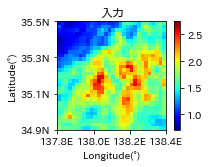

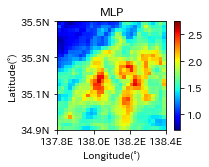

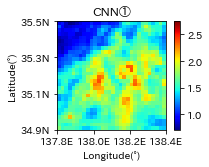

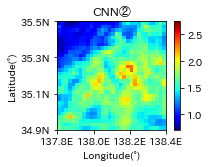

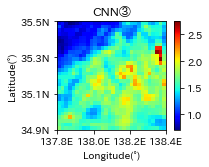

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([np.sqrt(((data[:,6300*(j+1):6300*(j+1)+900] - data[:,:900])**2).mean(axis=0)).min() for j in range(5)])
cmax = max([np.sqrt(((data[:,6300*(j+1):6300*(j+1)+900] - data[:,:900])**2).mean(axis=0)).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.sqrt(((data[:,6300*(i+1):6300*(i+1)+900] - data[:,:900])**2).mean(axis=0)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 気温(T)

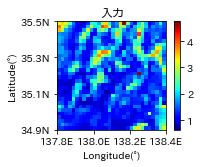

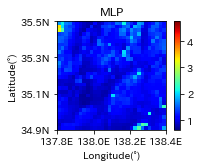

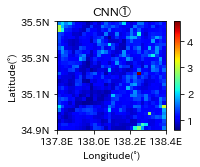

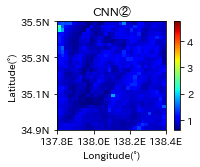

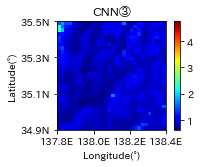

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([np.sqrt(((data[:,6300*(j+1)+900:6300*(j+1)+1800] - data[:,900:1800])**2).mean(axis=0)).min() for j in range(5)])
cmax = max([np.sqrt(((data[:,6300*(j+1)+900:6300*(j+1)+1800] - data[:,900:1800])**2).mean(axis=0)).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.sqrt(((data[:,6300*(i+1)+900:6300*(i+1)+1800] - data[:,900:1800])**2).mean(axis=0)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 湿数(R)

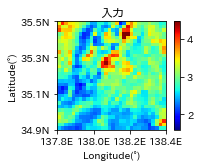

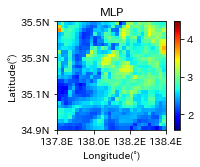

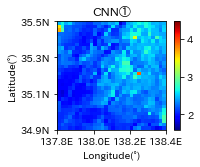

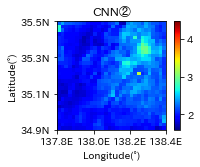

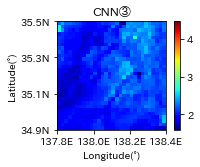

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([np.sqrt(((data[:,6300*(j+1)+1800:6300*(j+1)+2700] - data[:,1800:2700])**2).mean(axis=0)).min() for j in range(5)])
cmax = max([np.sqrt(((data[:,6300*(j+1)+1800:6300*(j+1)+2700] - data[:,1800:2700])**2).mean(axis=0)).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.sqrt(((data[:,6300*(i+1)+1800:6300*(i+1)+2700] - data[:,1800:2700])**2).mean(axis=0)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 東西風(U)

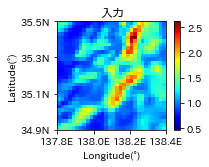

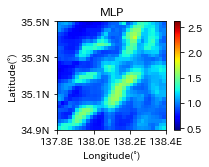

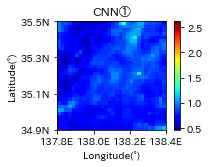

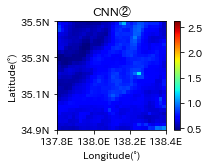

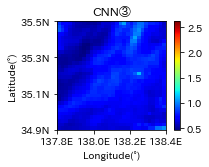

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([np.sqrt(((data[:,6300*(j+1)+2700:6300*(j+1)+3600] - data[:,2700:3600])**2).mean(axis=0)).min() for j in range(5)])
cmax = max([np.sqrt(((data[:,6300*(j+1)+2700:6300*(j+1)+3600] - data[:,2700:3600])**2).mean(axis=0)).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.sqrt(((data[:,6300*(i+1)+2700:6300*(i+1)+3600] - data[:,2700:3600])**2).mean(axis=0)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 南北風(V)

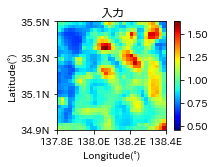

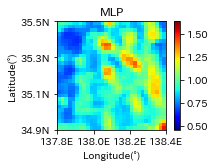

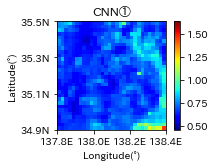

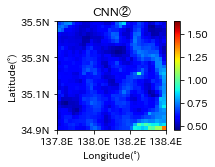

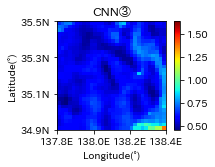

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([np.sqrt(((data[:,6300*(j+1)+3600:6300*(j+1)+4500] - data[:,3600:4500])**2).mean(axis=0)).min() for j in range(5)])
cmax = max([np.sqrt(((data[:,6300*(j+1)+3600:6300*(j+1)+4500] - data[:,3600:4500])**2).mean(axis=0)).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.sqrt(((data[:,6300*(i+1)+3600:6300*(i+1)+4500] - data[:,3600:4500])**2).mean(axis=0)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 風速(W)

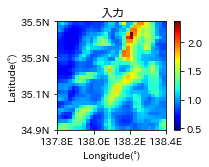

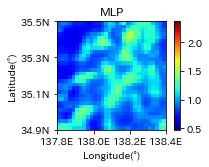

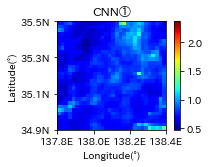

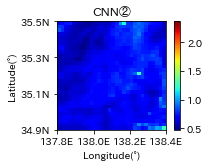

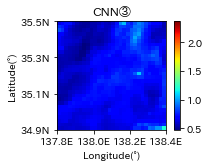

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([np.sqrt(((data[:,6300*(j+1)+4500:6300*(j+1)+5400] - data[:,4500:5400])**2).mean(axis=0)).min() for j in range(5)])
cmax = max([np.sqrt(((data[:,6300*(j+1)+4500:6300*(j+1)+5400] - data[:,4500:5400])**2).mean(axis=0)).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow(np.sqrt(((data[:,6300*(i+1)+4500:6300*(i+1)+5400] - data[:,4500:5400])**2).mean(axis=0)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

### ME

#### 降水量(P)

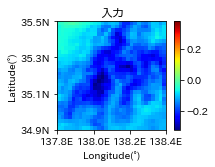

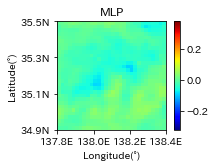

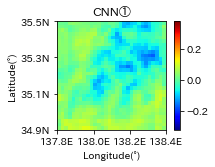

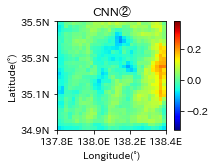

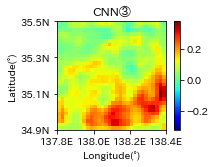

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([(data[:,6300*(j+1):6300*(j+1)+900] - data[:,:900]).mean(axis=0).min() for j in range(5)])
cmax = max([(data[:,6300*(j+1):6300*(j+1)+900] - data[:,:900]).mean(axis=0).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((data[:,6300*(i+1):6300*(i+1)+900] - data[:,:900]).mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 気温(T)

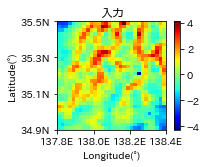

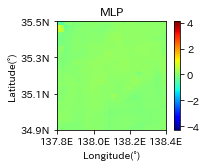

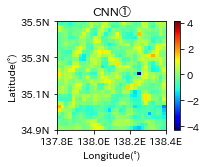

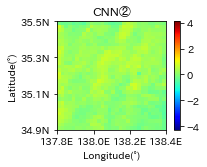

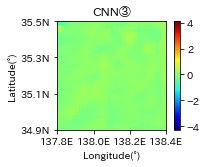

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([(data[:,6300*(j+1)+900:6300*(j+1)+1800] - data[:,900:1800]).mean(axis=0).min() for j in range(5)])
cmax = max([(data[:,6300*(j+1)+900:6300*(j+1)+1800] - data[:,900:1800]).mean(axis=0).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((data[:,6300*(i+1)+900:6300*(i+1)+1800] - data[:,900:1800]).mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 湿数(R)

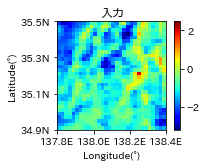

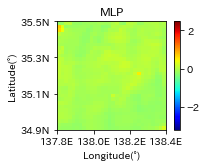

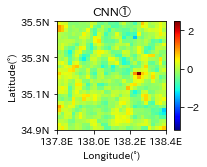

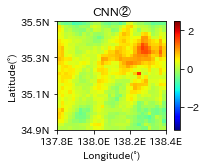

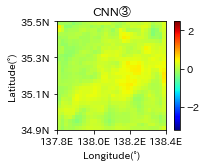

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([(data[:,6300*(j+1)+1800:6300*(j+1)+2700] - data[:,1800:2700]).mean(axis=0).min() for j in range(5)])
cmax = max([(data[:,6300*(j+1)+1800:6300*(j+1)+2700] - data[:,1800:2700]).mean(axis=0).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((data[:,6300*(i+1)+1800:6300*(i+1)+2700] - data[:,1800:2700]).mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 東西風(U)

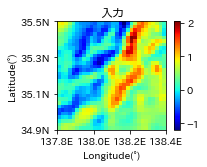

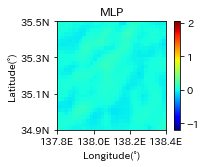

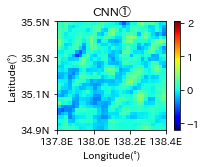

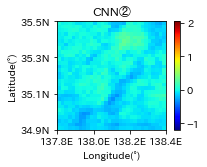

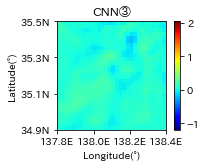

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([(data[:,6300*(j+1)+2700:6300*(j+1)+3600] - data[:,2700:3600]).mean(axis=0).min() for j in range(5)])
cmax = max([(data[:,6300*(j+1)+2700:6300*(j+1)+3600] - data[:,2700:3600]).mean(axis=0).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((data[:,6300*(i+1)+2700:6300*(i+1)+3600] - data[:,2700:3600]).mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 南北風(V)

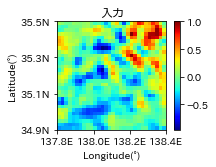

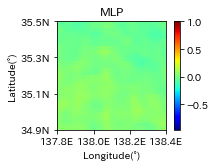

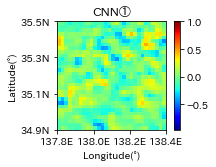

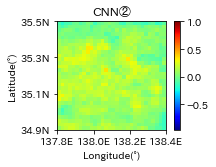

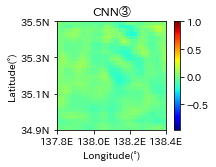

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([(data[:,6300*(j+1)+3600:6300*(j+1)+4500] - data[:,3600:4500]).mean(axis=0).min() for j in range(5)])
cmax = max([(data[:,6300*(j+1)+3600:6300*(j+1)+4500] - data[:,3600:4500]).mean(axis=0).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((data[:,6300*(i+1)+3600:6300*(i+1)+4500] - data[:,3600:4500]).mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 風速(W)

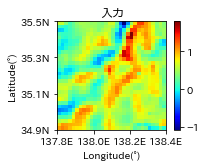

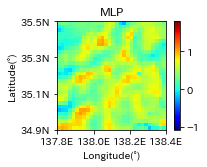

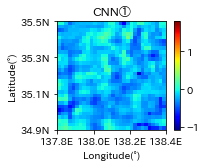

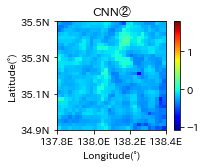

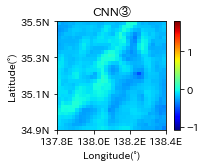

In [ ]:
# カラーバー範囲：最小-最大
titles = ['入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
cmin = min([(data[:,6300*(j+1)+4500:6300*(j+1)+5400] - data[:,4500:5400]).mean(axis=0).min() for j in range(5)])
cmax = max([(data[:,6300*(j+1)+4500:6300*(j+1)+5400] - data[:,4500:5400]).mean(axis=0).max() for j in range(5)])
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((data[:,6300*(i+1)+4500:6300*(i+1)+5400] - data[:,4500:5400]).mean(axis=0).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

### 発生確率

#### 降水量0.1mm/h以上の発生確率

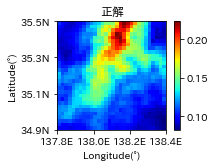

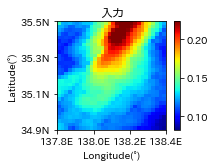

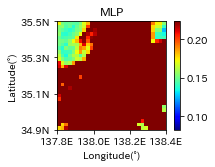

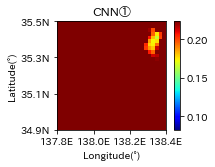

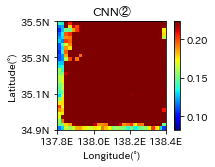

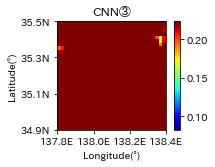

In [ ]:
# カラーバー範囲：正解の最小-最大
titles, threshold = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③'], 0.1
cmin, cmax = (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).min(), (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((np.count_nonzero(data[:,6300*i:6300*i+900]>threshold, axis=0) / len(data)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 降水量1mm/h以上の発生確率

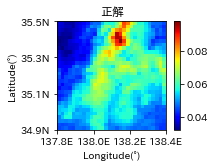

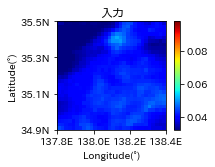

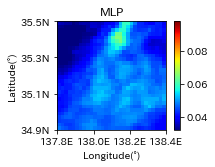

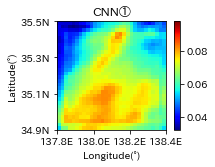

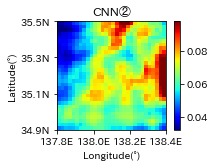

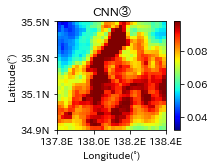

In [ ]:
# カラーバー範囲：正解の最小-最大
titles, threshold = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③'], 1
cmin, cmax = (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).min(), (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((np.count_nonzero(data[:,6300*i:6300*i+900]>threshold, axis=0) / len(data)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 降水量4mm/h以上の発生確率

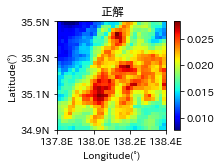

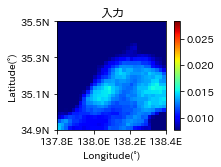

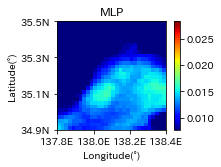

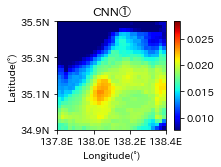

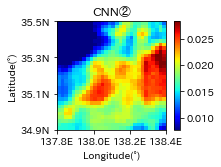

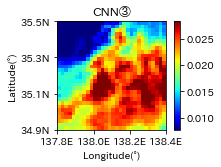

In [ ]:
# カラーバー範囲：正解の最小-最大
titles, threshold = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③'], 4
cmin, cmax = (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).min(), (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((np.count_nonzero(data[:,6300*i:6300*i+900]>threshold, axis=0) / len(data)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 降水量10mm/h以上の発生確率

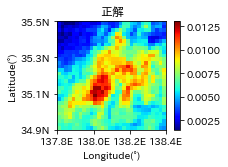

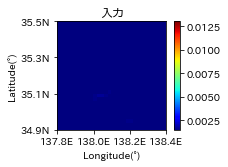

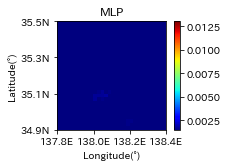

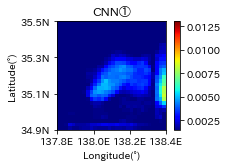

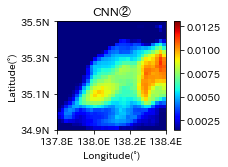

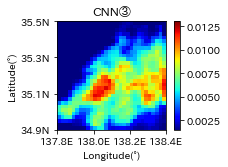

In [ ]:
# カラーバー範囲：正解の最小-最大
titles, threshold = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③'], 10
cmin, cmax = (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).min(), (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((np.count_nonzero(data[:,6300*i:6300*i+900]>threshold, axis=0) / len(data)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

#### 降水量30mm/h以上の発生確率

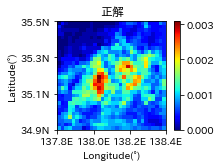

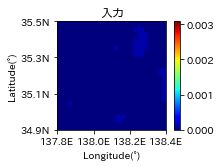

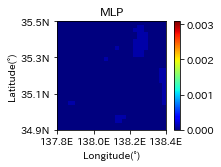

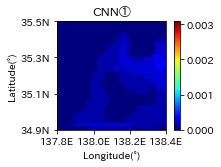

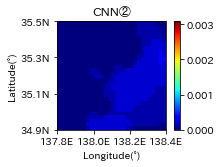

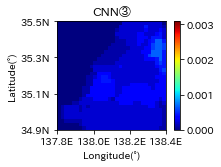

In [ ]:
# カラーバー範囲：正解の最小-最大
titles, threshold = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③'], 30
cmin, cmax = (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).min(), (np.count_nonzero(data[:,:900]>threshold, axis=0) / len(data)).max()
for i,title in enumerate(titles):
  plt.figure(figsize=(3,2))
  plt.imshow((np.count_nonzero(data[:,6300*i:6300*i+900]>threshold, axis=0) / len(data)).reshape((30,30))[::-1], cmap='jet')
  plt.xticks(ticks=[-0.5,9.5,19.5,29.5], labels=['137.8E','138.0E','138.2E','138.4E'])
  plt.yticks(ticks=[-0.5,9.5,19.5,29.5], labels=['35.5N','35.3N','35.1N','34.9N'])
  plt.xlabel('Longitude(°)')
  plt.ylabel('Latitude(°)')
  plt.title(title)
  plt.colorbar()
  plt.clim(cmin,cmax)
  plt.show()

## 散布図(yyplot)

### 降水量(P)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


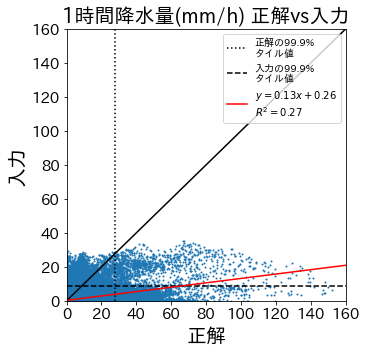

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


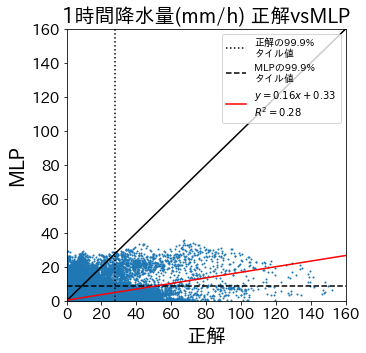

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


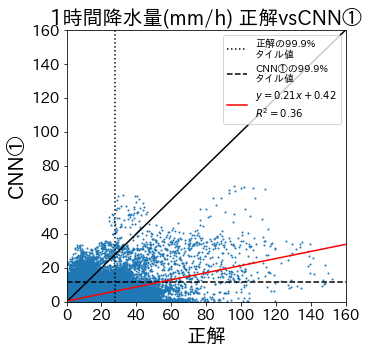

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


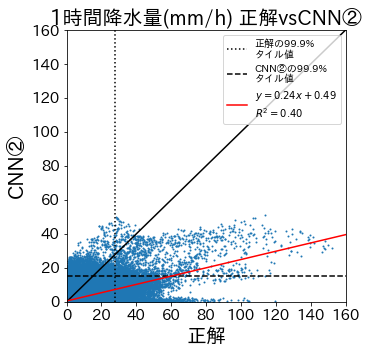

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


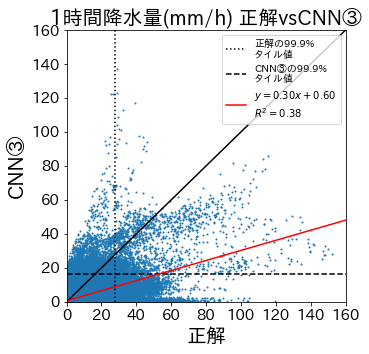

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
x = np.linspace(0,160,161)
for i, title in enumerate(titles[1:]):
  coef = np.polyfit(data[:,:900].reshape(-1), data[:,(i+1)*6300:(i+1)*6300+900].reshape(-1), 1)
  y = np.poly1d(coef)(x)
  plt.figure(figsize=(5,5))
  plt.plot(x, x, color='black')
  plt.plot([np.percentile(data[:,:900], q=99.9)]*161, x, color='black', linestyle=':', label='正解の99.9%\nタイル値')
  plt.plot(x, [np.percentile(data[:,6300*(i+1):6300*(i+1)+900], q=99.9)]*161, color='black', linestyle='--', label=f'{title}の99.9%\nタイル値')
  plt.scatter(data[:,:900].reshape(-1), data[:,(i+1)*6300:(i+1)*6300+900].reshape(-1), s=1)
  plt.plot(x, y, label=f'$y={coef[0]:3.2f}x+{coef[1]:3.2f}$\n$R^2={r2_score(data[:,:900].reshape(-1), data[:,(i+1)*6300:(i+1)*6300+900].reshape(-1)):3.2f}$', color='red')
  plt.xlabel(titles[0], fontsize=20)# Precipitation Per Hour
  plt.ylabel(title, fontsize=20)# Frequency
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlim(0,160)
  plt.ylim(0,160)
  t = f'1時間降水量(mm/h) 正解vs{title}'
  plt.title(t, fontsize=20)
  plt.legend(loc='upper right')
  plt.show()

### 気温(T)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


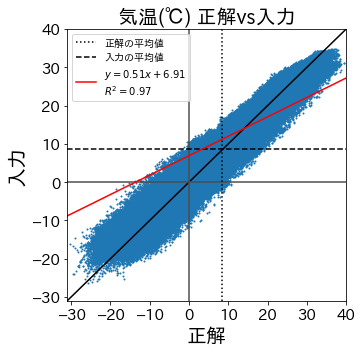

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


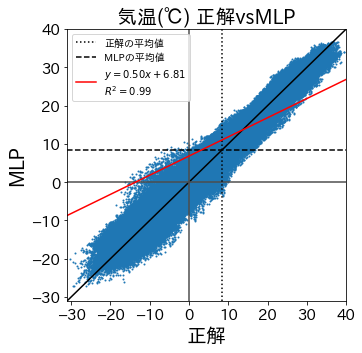

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


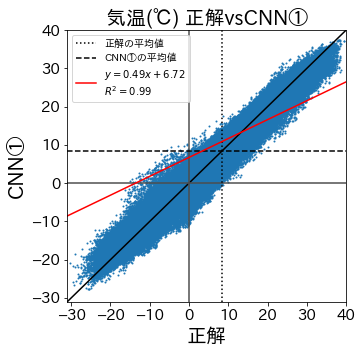

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


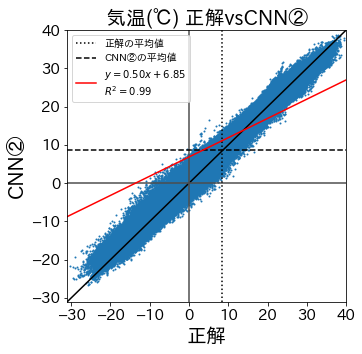

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


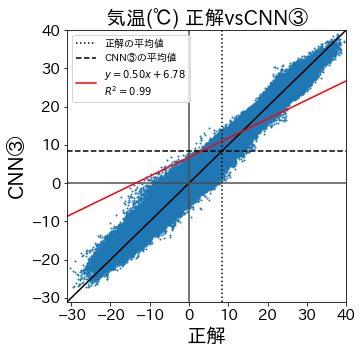

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
x = np.linspace(-31,40,72)
for i, title in enumerate(titles[1:]):
  coef = np.polyfit(data[:,900:1800].reshape(-1) - 273.15, data[:,(i+1)*6300+900:(i+1)*6300+1800].reshape(-1) - 273.15, 1)
  y = np.poly1d(coef)(x)
  plt.figure(figsize=(5,5))
  plt.plot(x, x, color='black')
  plt.plot([0]*72, x, color='0.3')
  plt.plot(x, [0]*72, color='0.3')
  plt.plot([data[:,900:1800].mean() - 273.15]*72, x, color='black', linestyle=':', label='正解の平均値')
  plt.plot(x, [data[:,6300*(i+1)+900:6300*(i+1)+1800].mean() - 273.15]*72, color='black', linestyle='--', label=f'{title}の平均値')
  plt.scatter(data[:,900:1800].reshape(-1) - 273.15, data[:,(i+1)*6300+900:(i+1)*6300+1800].reshape(-1) - 273.15, s=1)
  plt.plot(x, y, label=f'$y={coef[0]:3.2f}x+{coef[1]:3.2f}$\n$R^2={r2_score(data[:,900:1800].reshape(-1) - 273.15, data[:,(i+1)*6300+900:(i+1)*6300+1800].reshape(-1) - 273.15):3.2f}$', color='red')
  plt.xlabel(titles[0], fontsize=20)
  plt.ylabel(title, fontsize=20)
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlim(-31,40)
  plt.ylim(-31,40)
  t = f'気温(℃) 正解vs{title}'
  plt.title(t, fontsize=20)
  plt.legend(loc='upper left')
  plt.show()

### 湿度(R)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


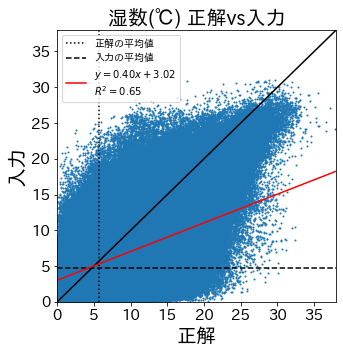

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


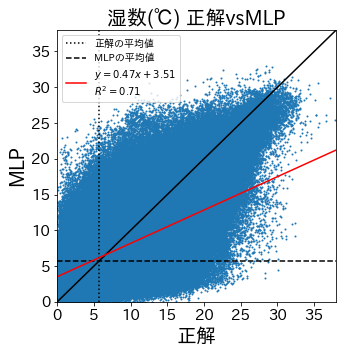

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


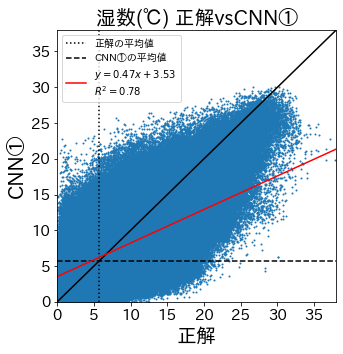

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


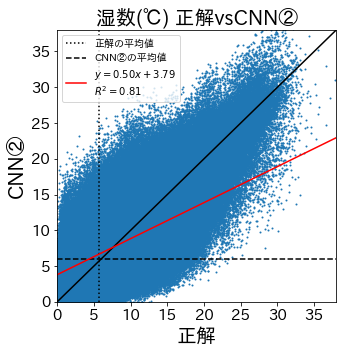

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


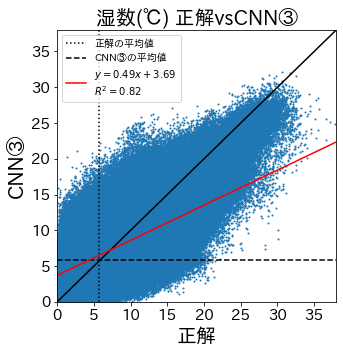

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
x = np.linspace(0,38,39)
for i, title in enumerate(titles[1:]):
  coef = np.polyfit(data[:,1800:2700].reshape(-1), data[:,(i+1)*6300+1800:(i+1)*6300+2700].reshape(-1), 1)
  y = np.poly1d(coef)(x)
  plt.figure(figsize=(5,5))
  plt.plot(x, x, color='black')
  plt.plot([data[:,1800:2700].mean()]*39, x, color='black', linestyle=':', label='正解の平均値')
  plt.plot(x, [data[:,6300*(i+1)+1800:6300*(i+1)+2700].mean()]*39, color='black', linestyle='--', label=f'{title}の平均値')
  plt.scatter(data[:,1800:2700].reshape(-1), data[:,(i+1)*6300+1800:(i+1)*6300+2700].reshape(-1), s=1)
  plt.plot(x, y, label=f'$y={coef[0]:3.2f}x+{coef[1]:3.2f}$\n$R^2={r2_score(data[:,1800:2700].reshape(-1), data[:,(i+1)*6300+1800:(i+1)*6300+2700].reshape(-1)):3.2f}$', color='red')
  plt.xlabel(titles[0], fontsize=20)
  plt.ylabel(title, fontsize=20)
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlim(0,38)
  plt.ylim(0,38)
  t = f'湿数(℃) 正解vs{title}'
  plt.title(t, fontsize=20)
  plt.legend()
  plt.show()

### 風速(W)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


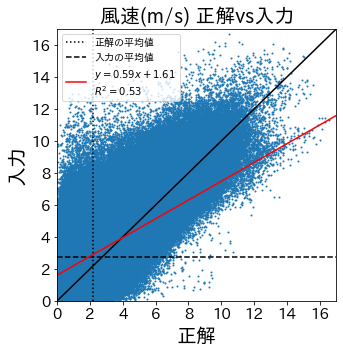

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


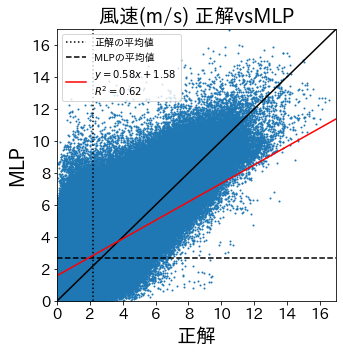

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


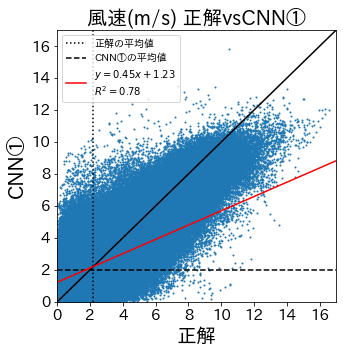

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


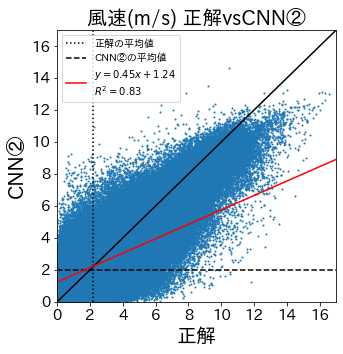

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


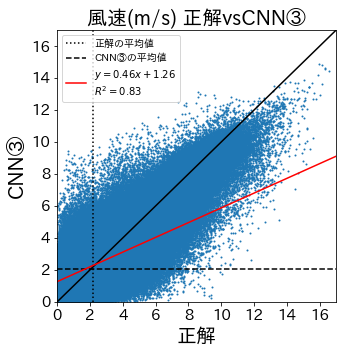

In [ ]:
titles = ['正解', '入力', 'MLP', 'CNN①', 'CNN②', 'CNN③']
x = np.linspace(0,17,18)
for i, title in enumerate(titles[1:]):
  coef = np.polyfit(data[:,4500:5400].reshape(-1), data[:,(i+1)*6300+4500:(i+1)*6300+5400].reshape(-1), 1)
  y = np.poly1d(coef)(x)
  plt.figure(figsize=(5,5))
  plt.plot(x, x, color='black')
  plt.plot([data[:,4500:5400].mean()]*18, x, color='black', linestyle=':', label='正解の平均値')
  plt.plot(x, [data[:,6300*(i+1)+4500:6300*(i+1)+5400].mean()]*18, color='black', linestyle='--', label=f'{title}の平均値')
  plt.scatter(data[:,4500:5400].reshape(-1), data[:,(i+1)*6300+4500:(i+1)*6300+5400].reshape(-1), s=1)
  plt.plot(x, y, label=f'$y={coef[0]:3.2f}x+{coef[1]:3.2f}$\n$R^2={r2_score(data[:,4500:5400].reshape(-1), data[:,(i+1)*6300+4500:(i+1)*6300+5400].reshape(-1)):3.2f}$', color='red')
  plt.xlabel(titles[0], fontsize=20)
  plt.ylabel(title, fontsize=20)
  plt.xticks(fontsize=15)
  plt.yticks(fontsize=15)
  plt.xlim(0,17)
  plt.ylim(0,17)
  t = f'風速(m/s) 正解vs{title}'
  plt.title(t, fontsize=20)
  plt.legend(loc='upper left')
  plt.show()